# Машинное обучение, ФКН ВШЭ

# Практическое задание 10. Обучение без учителя.

## Общая информация
Дата выдачи: 26.03.2025

Мягкий дедлайн: 13.04.2025 23:59 MSK

Жёсткий дедлайн: 17.04.2025 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи).

Сдавать задание после указанного срока сдачи нельзя.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-10-Username.ipynb

Username — ваша фамилия на латинице

## О задании

В этом задании мы посмотрим на несколько алгоритмов кластеризации и применим их к географическим и текстовым данным. Также мы подробно остановимся на тематическом моделировании текстов, задаче обучения представлений и в каком-то смысле поработаем с semi-supervised learning.



In [ ]:
import pandas as pd
import numpy as np

np.random.seed(0xFFFFFFF)

## Часть 1. Кластеризация автобусных остановок

В этом задании мы сравним разные алгоритмы кластеризации для данных об автобусных остановках Москвы.

**Задание 1.1 (1 балл).** Реализуйте алгоритм спектральной кластеризации, который упоминался на лекции. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Напомним, что для графа с матрицей смежности $W = \{w_{ij}\}_{i, j = 1 \dots \ell}$ лапласиан определяется как:

$$
L = D - W,
$$

где $D = \text{diag}(d_1, ..., d_{\ell}), d_i = \sum_{j=1}^{\ell} w_{ij}$.

Воспользуемся библиотекой eigh для поиска собственных векторов симметричной матрицы

In [ ]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans
from scipy.linalg import eigh


class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        '''
        Spectral clustering algorithm
        param n_clusters: number of clusters to form
        param n_components: number of eigenvectors to use
        '''

        if n_components is None:
            n_components = n_clusters

        self.n_components = n_components
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)

    def fit_predict(self, X, y=None):
        '''
        Perform spectral clustering from graph adjacency matrix
        and return vertex labels.
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, ) - vertex labels
        '''

        eigenvectors = self._generate_eigenvectors(X)
        labels = self.kmeans.fit_predict(eigenvectors[:, 1:])
        return labels

    def _generate_eigenvectors(self, X):
        '''
        Compute eigenvectors for spectral clustering
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, n_components) - eigenvectors
        '''
        # задаем диаганальную матрицу
        lol = X.sum(axis=1)
        D = np.diag(lol)
        # задаем лапласиан
        L = D - X
        # находим собственные значения и вектора
        eigvals, eigvecs = eigh(L)
        low_eigvecs = eigvecs[:, :self.n_components]

        return low_eigvecs

Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [ ]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)


graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)

true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]

assert labels.shape == (n_vertices, )
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

Теперь можем приступить к работе с реальными данными. Скачайте файл с данными об остановках общественного транспорта **в формате .xlsx** по [ссылке](https://data.mos.ru/opendata/download/60464/1/201) (так гарантированно не возникнет проблем с парсингом файла) и загрузите таблицу в ноутбук. Альтернативная ссылка: [отсюда](https://disk.yandex.ru/i/J0HlcDXd_KyIeg). Для удобства визуализации мы будем работать только с остановками в ЦАО.

In [ ]:
data = pd.read_excel('transport.xlsx')
data = data[data.AdmArea_en == "Czentral`ny'j administrativny'j okrug"]
data = data.reset_index()
data.head()

,index,ID_en,Name_en,Longitude_WGS84_en,Latitude_WGS84_en,Street_en,AdmArea_en,District_en,RouteNumbers_en,StationName_en,Direction_en,Pavilion_en,OperatingOrgName_en,EntryState_en,global_id,geoData
0,278,347,"«2-й Лесной пер.», улица Бутырский Вал (347)",37.586584,55.782106,улица Бутырский Вал,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ18; А12; АТ56; АТ78,2-й Лесной пер.,NaN,да,ГУП «Мосгортранс»,active,889085436,NaN
1,279,349,"«Ул. Сущевский Вал», Новослободская улица (349)",37.590714,55.790630,Новослободская улица,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ47; АМ10; АТ3; АТ56; АТ78,Ул. Сущевский Вал,NaN,да,ГУП «Мосгортранс»,active,889085437,NaN
2,355,479,"«Стадион Лужники (южн.) (пос.)», улица Лужники...",37.565972,55.714265,улица Лужники,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Стадион Лужники (южн.) (пос.),NaN,да,ГУП «Мосгортранс»,active,889085549,NaN
3,356,480,"«Спортзал Дружба», Лужнецкая набережная (480)",37.570191,55.712504,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Спортзал Дружба,NaN,да,ГУП «Мосгортранс»,active,889085550,NaN
4,357,481,"«Лужнецкая наб.», Лужнецкая набережная (481)",37.574559,55.713770,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Лужнецкая наб.,NaN,да,ГУП «Мосгортранс»,active,889085551,NaN


Воспользуемся библиотекой `folium` для визуализации данных.

In [ ]:
import folium

map = folium.Map([55.75215, 37.61819], zoom_start=12)
for id, row in data.iterrows():
    folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10).add_to(map)
map

**Задание 1.2 (1 балл).** Попробуем построить граф, в котором вершинами будут остановки. Как вы уже могли заметить, для каждой остановки указаны номера маршрутов, проходящих через неё. Логично соединить ребрами соседние остановки каждого маршрута. Однако мы не знаем, в каком порядке автобусы объезжают остановки. Но мы можем применить эвристический алгоритм, который восстановит нам порядок маршрутов:

* Для каждого маршрута выделим список всех остановок, через которые он проходит.
* Выберем начальную остановку маршрута как точку, наиболее удаленную от всех остальных остановок этого маршрута.
* Каждую следующую точку маршрута будем выбирать как самую близкую из оставшихся точек (не включенных в маршрут ранее).

Фактически, у нас получается жадное решение задачи коммивояжера. Когда мы отсортировали маршруты, можем построить по ним граф. Будем строить его по таким правилам:

* Между двумя остановками будет ребро, если они являются соседними хотя бы на одном маршруте. Вес ребра равен числу маршрутов, на которых остановки являются соседними.
* В графе не будет петель (то есть у матрицы смежности будет нулевая диагональ).

Реализуйте предложенный способ построения графа. Для этого рекомендуется воспользоваться шаблонами, приведенными ниже.

In [ ]:
data['ID_en'].nunique == data.shape[0]

False

In [ ]:
from scipy.spatial.distance import cdist

def get_routes(data):
    '''
    Accumulate routes from raw data
    param data: pd.DataFrame - public transport stops data
    return: dict - unsorted stops ids for each route,
                   e.g. routes['A1'] = [356, 641, 190]
    '''

    d_route_stations = {}
    for _, row in data.iterrows():
      routes = row['RouteNumbers_en'].split(';')
      id = row['ID_en']
      for route in routes:
        route = route.strip()
        d_route_stations.setdefault(route, []).append(int(id))
    return d_route_stations


def sort_routes(data, routes):
    '''
    Sort routes according to the proposed algorithm
    param data: pd.DataFrame - public transport stops data
    param routes: dict - unsorted stops ids for each route
    return: dict - sorted stops ids for each route
    '''
    for route in routes:
      stations = routes[route]
      coords = data[data['ID_en'].isin(stations)][['Latitude_WGS84_en', 'Longitude_WGS84_en']].to_numpy()
      idx = data[data['ID_en'].isin(stations)]['ID_en'].to_numpy()

      index_to_id = {i: stop_id for i, stop_id in enumerate(idx)}

      # ищем начальную остановку
      dist = cdist(coords, coords, metric='euclidean')
      # dist = cdist(coords, coords, metric='haversine')
      start_row_idx = np.argmax(dist.sum(axis=1))

      # print(stations, start_id)

      visited = [start_row_idx]
      unvisited = list(range(len(idx)))
      unvisited.remove(start_row_idx)

      # жадная маршрутизация
      while unvisited:
        last_row_idx = visited[-1]
        # находим ближайшую непройденную остановку
        next_row_idx = min(unvisited, key=lambda i: dist[last_row_idx][i])
        visited.append(next_row_idx)
        unvisited.remove(next_row_idx)

      # возвращаем отсортированные ID остановок
      sorted_ids = [index_to_id[i] for i in visited]
      routes[route] = sorted_ids
    return routes



def get_adjacency_matrix(data, sorted_routes):
    '''
    Compute adjacency matrix for sorted routes
    param data: pd.DataFrame - public transport stops data
    param sorted_routes: dict - sorted stops ids for each route
    return: (n_samples, n_samples) - graph adjacency matrix
    '''
    n = data.shape[0]
    adjacency_matrix = np.zeros((n, n), dtype=int)
    id_to_index = {stop_id: idx for idx, stop_id in enumerate(data['ID_en'])}

    for route in sorted_routes.values():
        for i in range(len(route) - 1):
            u, v = route[i], route[i + 1]
            ui, vi = id_to_index[u], id_to_index[v]
            adjacency_matrix[ui, vi] += 1
            adjacency_matrix[vi, ui] += 1

    return adjacency_matrix

In [ ]:
routes = get_routes(data)
sorted_routes = sort_routes(data, routes)
adjacency_matrix = get_adjacency_matrix(data, sorted_routes)

In [ ]:
len(sorted_routes.keys())

163

**Проверим, что маршруты получились адекватными. Для этого нарисуем их на карте.**

я немного переписала и апгрейднула визуализацию, тк у меня в sorted_routes ключи в виде ID_en , а не в виде индексов строки (мне уже лень переписывать весь алгоритм из-за этого)

Можно нажать на любой маршрут и увидеть его номер))

In [ ]:
import random
map = folium.Map([55.75215, 37.61819], zoom_start=12)
colors = ['#FF0000', '#FF7F00', '#FFFF00', '#00FF00', '#00FFFF', '#0000FF', '#8B00FF', '#FF1493', '#00CED1', '#FF6347']

for route_id in np.random.choice(list(sorted_routes.keys()), size=5, replace=False):
    station_df = data[data['ID_en'].isin(sorted_routes[route_id])]
    coords = station_df[['Latitude_WGS84_en', 'Longitude_WGS84_en']].to_numpy().tolist()
    folium.PolyLine(coords, color = random.choice(colors), popup=f'Маршрут {route_id}').add_to(map)

map

В целом маршруты выглядят адекватно. Но иногда попадаются более резкие и более разбросанные линии, но это нормально, так как мы приблизительно прикидывали маршруты

In [ ]:
# map = folium.Map([55.75215, 37.61819], zoom_start=12)
# for route_id in np.random.choice(list(sorted_routes.keys()), size=5):
#     coords = data.loc[
#         sorted_routes[route_id],
#         ['Latitude_WGS84_en', 'Longitude_WGS84_en']
#     ].values.tolist()
#     folium.vector_layers.PolyLine(coords).add_to(map)

# map

**Задание 1.3 (0 баллов)**. Реализуйте функцию `draw_clustered_map`, которая рисует карту центра Москвы с кластерами остановок, раскрашенными в разные цвета.

In [ ]:
import matplotlib.cm as cm
import matplotlib.colors as mcolors
def draw_clustered_map(data, labels):
    '''
    Create map with coloured clusters
    param data: pd.DataFrame - public transport stops data
    param labels: (n_samples, ) - cluster labels for each stop
    return: folium.Map - map with coloured clusters
    '''

    map = folium.Map(location=[55.75215, 37.61819], zoom_start=12)

    # Генерируем цвета сразу через colormap
    colormap = cm.get_cmap('tab20', len(set(labels)))
    colors = [mcolors.to_hex(colormap(i)) for i in range(len(set(labels)))]

    for i, (_, row) in enumerate(data.iterrows()):
        folium.CircleMarker(
            location=[row['Latitude_WGS84_en'], row['Longitude_WGS84_en']],
            radius=5,
            color=colors[labels[i]],
            fill=True,
            fill_opacity=0.8,
            weight=0.5
        ).add_to(map)

    return map

n = len(sorted_routes.keys())
gc = GraphClustering(n_clusters=n, random_state=42)
labels = gc.fit_predict(adjacency_matrix)

cluster_map = draw_clustered_map(data, labels)
cluster_map

<ipython-input-238-014dba4cfcf3>:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab20', len(set(labels)))


**Задание 1.4 (1.5 балла)**. Примените алгоритмы кластеризации и подберите гиперпараметры так, чтобы кластеры получились осмысленными (нет такого, что все принадлежит одному кластеру или большая часть точек это шум):
- `sklearn.clustering.KMeans` - `n_clusters`
- `sklearn.clustering.DBSCAN` - `eps`
- ваш `SpectralClustering` - `n_clusters` и `n_components`

Для ряда алгоритмов, в частности DBSCAN, подобрать оптимальные параметры может быть ой, как непросто. Чтобы помочь сохранить нервные клетки рекомендуется пользоваться метриками Intrinsic Evaluation для кластеризации. Для каждого алгоритма скорее всего придется брать разные метрики, а может быть оптимизировать сразу несколько.

Ваша задача - выбрать подходящую метрику, можно взять что-то из списка ниже, можно спросить у гугла. Применить GridSearch, `optuna` или `hyperopt` и желательно завернуть отбор параметров в функцию, пригодится далее

1. $
   \text{Calinski-Harabasz Index} \in [0, \inf] = \frac{\sum_{i=1}^k BCSS_i/(k-1)}{\sum_{i=1}^k WCSS_i/(n-k)} = \frac{\sum_{i=1}^k n_i \| \mathbf{c}_i - \mathbf{c} \|^2/(k-1)}{\sum_{i=1}^k \sum_{\mathbf{x} \in C_i} \|\mathbf{x} - \mathbf{c}_i\|^2/(n-k)} \rightarrow max
   $
   - Отношение 1) расстояния от центра кластера до центра всех данных к 2) расстоянию от центра кластера до точки
   - Чем однороднее и дальше друг от друга кластеры, тем лучше
2. $
   \text{Silhouette Score} \in [0, 1] = \sum_i \frac{b_i - a_i}{\max(a_i, b_i)} \rightarrow max
   $
   - $a_i$ - среднее расстояние до точек внутри своего кластера
   - $b_i$ - среднее расстояние до точек из ближайшего кластера
   - Если в своем кластере точки близко - кластер плотный, идеальный вариант, скор равен 1, если свой кластер совпадает с соседним - кластеры неразделимы, скор равен нулю
   - Чем однороднее и разделимее кластеры, тем лучше
3. $\text{Davies-Bouldin Index} \in [0, inf] = \frac{1}{k} \sum_{i=1}^{k} \max_{j \neq i} \left( \frac{WCSS_i + WCSS_j}{d(c_i, c_j)} \right) \rightarrow min $
   - Отношение внутрикластерных расстояний к межкластерному расстоянию между двумя центрами
   - Если кластеры далеко друг от друга, но при этом однородные, скор наименьший
3. $\text{Elbow Method}$ - последовательное сравнение $WCSS$ из пункта 1 для разного числа параметров. Если уменьшение меньше определенного порога - останавливаемся, считаем это значение оптимальным

**KMeans - Silhouette Score**:
Silhouette хорошо работает для сферических кластеров, которые стремится построить KMeans. Она измеряет, насколько точки близки к своему кластеру и далеки от соседнего — это прямо отражает цель KMeans минимизировать внутрикластерные расстояния.

**DBSCAN - Davies-Bouldin Score**:
DBSCAN не требует задания числа кластеров и устойчив к выбросам, а Davies-Bouldin измеряет компактность кластеров и их разделённость. Он не чувствителен к шуму и подходит для оценки кластеров произвольной формы, которые формирует DBSCAN.

**Spectral Clustering  Calinski-Harabasz Score**:
Spectral Clustering хорошо выделяет кластеры сложной формы и структуры, а Calinski-Harabasz оценивает соотношение межкластерной дисперсии к внутрикластерной. Это делает его подходящим для оценки качества кластеров, построенных на графовой структуре.











In [ ]:
!pip install -q optuna

In [ ]:
import optuna
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

from sklearn.cluster import DBSCAN
from sklearn.metrics import davies_bouldin_score

from sklearn.metrics import calinski_harabasz_score

In [ ]:
def optimize_clustering(algorithm: str, X, adjacency_matrix=None, n_trials=300, metric_dbscan = 'euclidean', eps_min=0.015, eps_max=0.035, min_samples_min=2, min_samples_max = 6):
    X_scaled = StandardScaler(with_mean=False).fit_transform(X)

    def kmeans(trial):
        n_clusters = trial.suggest_int("n_clusters", 2, 170)

        model = KMeans(n_clusters=n_clusters, random_state=42)
        labels = model.fit_predict(X_scaled)

        return silhouette_score(X_scaled, labels)

    def dbscan(trial):
        eps = trial.suggest_float("eps", eps_min, eps_max, step=0.005)
        min_samples = trial.suggest_int("min_samples", min_samples_min, min_samples_max)

        model = DBSCAN(eps=eps, min_samples=min_samples, metric=metric_dbscan)
        labels = model.fit_predict(X_scaled)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        print(f"Trial {trial.number}: eps={eps}, min_samples={min_samples}, n_clusters={n_clusters}")
        # вводим проверку на бессмысленные варианты кластеризации, где все точки как один кластер или все как шум
        if n_clusters < 2:
            raise optuna.exceptions.TrialPruned()

        if metric_dbscan == 'cosine':
            score = silhouette_score(X_scaled, labels, metric='cosine')
        else:
            score = davies_bouldin_score(X_scaled, labels)
        return score

    def spectral(trial):
        n_clusters = trial.suggest_int("n_clusters", 2, 170)
        n_components = trial.suggest_int("n_components", 2, min(n_clusters + 5, adjacency_matrix.shape[0]))

        model = GraphClustering(n_clusters=n_clusters, n_components=n_components, random_state=42)
        labels = model.fit_predict(adjacency_matrix)

        return calinski_harabasz_score(X, labels)

    study = optuna.create_study(direction="maximize" if algorithm != 'dbscan' else "minimize")

    if algorithm == "kmeans":
        study = optuna.create_study(direction="maximize")
        study.optimize(kmeans, n_trials=n_trials)
    elif algorithm == "dbscan":
        study = optuna.create_study(direction="minimize")
        study.optimize(dbscan, n_trials=n_trials)
    elif algorithm == "spectral":
        study = optuna.create_study(direction="maximize")
        study.optimize(spectral, n_trials=n_trials)
    else:
        raise ValueError("Такого алгоритма не наблюдается ( Введите 'kmeans', 'dbscan' или 'spectral'.")

    return study

**Обучаем k-mean на лучших параметрах:**

In [ ]:
X = data[['Latitude_WGS84_en', 'Longitude_WGS84_en']].to_numpy()
X_scaled = StandardScaler().fit_transform(X)

In [ ]:
study = optimize_clustering("kmeans", X)
study.best_params, study.best_value

[I 2025-04-13 19:09:00,826] A new study created in memory with name: no-name-f1398ea0-7b5a-43db-9b9f-8f925d8794db
[I 2025-04-13 19:09:00,827] A new study created in memory with name: no-name-0c214e6f-bd0e-451b-b50f-aee560665daa
[I 2025-04-13 19:09:00,885] Trial 0 finished with value: 0.4235723238935803 and parameters: {'n_clusters': 135}. Best is trial 0 with value: 0.4235723238935803.
[I 2025-04-13 19:09:00,924] Trial 1 finished with value: 0.40229839562688846 and parameters: {'n_clusters': 37}. Best is trial 0 with value: 0.4235723238935803.
[I 2025-04-13 19:09:00,954] Trial 2 finished with value: 0.38477060622782205 and parameters: {'n_clusters': 9}. Best is trial 0 with value: 0.4235723238935803.
[I 2025-04-13 19:09:01,002] Trial 3 finished with value: 0.408959334150083 and parameters: {'n_clusters': 76}. Best is trial 0 with value: 0.4235723238935803.
[I 2025-04-13 19:09:01,132] Trial 4 finished with value: 0.4279075016996966 and parameters: {'n_clusters': 140}. Best is trial 4 wi

({'n_clusters': 166}, 0.4400996663389206)

In [ ]:
km = KMeans(n_clusters=study.best_params["n_clusters"], random_state=42)
labels = km.fit_predict(X_scaled)

Визуализация:

In [ ]:
cluster_map = draw_clustered_map(data, labels)
cluster_map

<ipython-input-238-014dba4cfcf3>:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab20', len(set(labels)))


**Обучаем dbscan на лучших параметрах:**

In [ ]:
study = optimize_clustering("dbscan", X)
study.best_params, study.best_value

[I 2025-04-13 19:09:53,854] A new study created in memory with name: no-name-32a3ea2e-cf2f-4067-bbec-0604dad9a448
[I 2025-04-13 19:09:53,855] A new study created in memory with name: no-name-365e5a0a-c958-44b1-a3c3-6d9c6c3a4fc7
[I 2025-04-13 19:09:53,879] Trial 0 finished with value: 3.1570372347541356 and parameters: {'eps': 0.02, 'min_samples': 5}. Best is trial 0 with value: 3.1570372347541356.
[I 2025-04-13 19:09:53,898] Trial 1 finished with value: 2.0066946575115923 and parameters: {'eps': 0.03, 'min_samples': 5}. Best is trial 1 with value: 2.0066946575115923.
[I 2025-04-13 19:09:53,915] Trial 2 finished with value: 1.3049883126513964 and parameters: {'eps': 0.015, 'min_samples': 3}. Best is trial 2 with value: 1.3049883126513964.
[I 2025-04-13 19:09:53,947] Trial 3 finished with value: 1.229838344982541 and parameters: {'eps': 0.03, 'min_samples': 3}. Best is trial 3 with value: 1.229838344982541.
[I 2025-04-13 19:09:53,967] Trial 4 finished with value: 1.3592759119430216 and p

Trial 0: eps=0.02, min_samples=5, n_clusters=2
Trial 1: eps=0.03, min_samples=5, n_clusters=7
Trial 2: eps=0.015, min_samples=3, n_clusters=13
Trial 3: eps=0.03, min_samples=3, n_clusters=52
Trial 4: eps=0.03, min_samples=4, n_clusters=20
Trial 5: eps=0.015, min_samples=4, n_clusters=3
Trial 6: eps=0.02, min_samples=6, n_clusters=0
Trial 7: eps=0.025, min_samples=6, n_clusters=1
Trial 8: eps=0.015, min_samples=5, n_clusters=1
Trial 9: eps=0.025, min_samples=5, n_clusters=5
Trial 10: eps=0.035, min_samples=2, n_clusters=271


[I 2025-04-13 19:09:54,129] Trial 10 finished with value: 1.3630537950073063 and parameters: {'eps': 0.035, 'min_samples': 2}. Best is trial 3 with value: 1.229838344982541.
[I 2025-04-13 19:09:54,228] Trial 11 finished with value: 1.3630537950073063 and parameters: {'eps': 0.035, 'min_samples': 2}. Best is trial 3 with value: 1.229838344982541.
[I 2025-04-13 19:09:54,275] Trial 12 finished with value: 1.229838344982541 and parameters: {'eps': 0.03, 'min_samples': 3}. Best is trial 3 with value: 1.229838344982541.
[I 2025-04-13 19:09:54,333] Trial 13 finished with value: 1.229838344982541 and parameters: {'eps': 0.03, 'min_samples': 3}. Best is trial 3 with value: 1.229838344982541.


Trial 11: eps=0.035, min_samples=2, n_clusters=271
Trial 12: eps=0.03, min_samples=3, n_clusters=52
Trial 13: eps=0.03, min_samples=3, n_clusters=52


[I 2025-04-13 19:09:54,381] Trial 14 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:54,428] Trial 15 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:54,540] Trial 16 finished with value: 1.2353272495665002 and parameters: {'eps': 0.02, 'min_samples': 2}. Best is trial 14 with value: 1.2000038845975232.


Trial 14: eps=0.025, min_samples=3, n_clusters=33
Trial 15: eps=0.025, min_samples=3, n_clusters=33
Trial 16: eps=0.02, min_samples=2, n_clusters=170


[I 2025-04-13 19:09:54,580] Trial 17 finished with value: 1.5350623105883467 and parameters: {'eps': 0.025, 'min_samples': 4}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:54,620] Trial 18 finished with value: 1.2493992839876749 and parameters: {'eps': 0.02, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:54,669] Trial 19 finished with value: 1.5350623105883467 and parameters: {'eps': 0.025, 'min_samples': 4}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:54,762] Trial 20 finished with value: 1.2744696853824364 and parameters: {'eps': 0.025, 'min_samples': 2}. Best is trial 14 with value: 1.2000038845975232.


Trial 17: eps=0.025, min_samples=4, n_clusters=14
Trial 18: eps=0.02, min_samples=3, n_clusters=23
Trial 19: eps=0.025, min_samples=4, n_clusters=14
Trial 20: eps=0.025, min_samples=2, n_clusters=214


[I 2025-04-13 19:09:54,796] Trial 21 finished with value: 1.229838344982541 and parameters: {'eps': 0.03, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:54,834] Trial 22 finished with value: 1.3875606522332162 and parameters: {'eps': 0.035, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:54,871] Trial 23 finished with value: 1.229838344982541 and parameters: {'eps': 0.03, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:54,894] Trial 24 finished with value: 1.5350623105883467 and parameters: {'eps': 0.025, 'min_samples': 4}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:54,958] Trial 25 finished with value: 1.2353272495665002 and parameters: {'eps': 0.02, 'min_samples': 2}. Best is trial 14 with value: 1.2000038845975232.


Trial 21: eps=0.03, min_samples=3, n_clusters=52
Trial 22: eps=0.035, min_samples=3, n_clusters=65
Trial 23: eps=0.03, min_samples=3, n_clusters=52
Trial 24: eps=0.025, min_samples=4, n_clusters=14
Trial 25: eps=0.02, min_samples=2, n_clusters=170
Trial 26: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:09:54,992] Trial 26 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:55,017] Trial 27 finished with value: 1.5350623105883467 and parameters: {'eps': 0.025, 'min_samples': 4}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:55,053] Trial 28 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:55,118] Trial 29 finished with value: 1.2353272495665002 and parameters: {'eps': 0.02, 'min_samples': 2}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:55,158] Trial 30 finished with value: 2.0676658178136256 and parameters: {'eps': 0.02, 'min_samples': 4}. Best is trial 14 with value: 1.2000038845975232.


Trial 27: eps=0.025, min_samples=4, n_clusters=14
Trial 28: eps=0.025, min_samples=3, n_clusters=33
Trial 29: eps=0.02, min_samples=2, n_clusters=170
Trial 30: eps=0.02, min_samples=4, n_clusters=6
Trial 31: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:09:55,208] Trial 31 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:55,317] Trial 32 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:55,371] Trial 33 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:55,418] Trial 34 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 32: eps=0.025, min_samples=3, n_clusters=33
Trial 33: eps=0.025, min_samples=3, n_clusters=33
Trial 34: eps=0.025, min_samples=3, n_clusters=33
Trial 35: eps=0.03, min_samples=2, n_clusters=239


[I 2025-04-13 19:09:55,556] Trial 35 finished with value: 1.2578696549932076 and parameters: {'eps': 0.03, 'min_samples': 2}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:55,600] Trial 36 finished with value: 1.2493992839876749 and parameters: {'eps': 0.02, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:55,642] Trial 37 finished with value: 1.3592759119430216 and parameters: {'eps': 0.03, 'min_samples': 4}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:55,673] Trial 38 finished with value: 2.2623913098945962 and parameters: {'eps': 0.025, 'min_samples': 5}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:55,724] Trial 39 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:55,760] Trial 40 finished with value: 2.5717686916698916 and parameters: {'eps': 0.015, 'min_samples': 

Trial 36: eps=0.02, min_samples=3, n_clusters=23
Trial 37: eps=0.03, min_samples=4, n_clusters=20
Trial 38: eps=0.025, min_samples=5, n_clusters=5
Trial 39: eps=0.025, min_samples=3, n_clusters=33
Trial 40: eps=0.015, min_samples=4, n_clusters=3
Trial 41: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:09:55,807] Trial 41 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:55,853] Trial 42 finished with value: 1.2493992839876749 and parameters: {'eps': 0.02, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:55,909] Trial 43 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 42: eps=0.02, min_samples=3, n_clusters=23
Trial 43: eps=0.025, min_samples=3, n_clusters=33
Trial 44: eps=0.025, min_samples=2, n_clusters=214


[I 2025-04-13 19:09:56,107] Trial 44 finished with value: 1.2744696853824364 and parameters: {'eps': 0.025, 'min_samples': 2}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:56,186] Trial 45 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:56,248] Trial 46 finished with value: 1.229838344982541 and parameters: {'eps': 0.03, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:56,292] Trial 47 finished with value: 1.5350623105883467 and parameters: {'eps': 0.025, 'min_samples': 4}. Best is trial 14 with value: 1.2000038845975232.


Trial 45: eps=0.025, min_samples=3, n_clusters=33
Trial 46: eps=0.03, min_samples=3, n_clusters=52
Trial 47: eps=0.025, min_samples=4, n_clusters=14
Trial 48: eps=0.02, min_samples=2, n_clusters=170


[I 2025-04-13 19:09:56,453] Trial 48 finished with value: 1.2353272495665002 and parameters: {'eps': 0.02, 'min_samples': 2}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:56,525] Trial 49 finished with value: 1.229838344982541 and parameters: {'eps': 0.03, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:56,600] Trial 50 finished with value: 1.5350623105883467 and parameters: {'eps': 0.025, 'min_samples': 4}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:56,646] Trial 51 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:56,694] Trial 52 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 49: eps=0.03, min_samples=3, n_clusters=52
Trial 50: eps=0.025, min_samples=4, n_clusters=14
Trial 51: eps=0.025, min_samples=3, n_clusters=33
Trial 52: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:09:56,775] Trial 53 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:56,851] Trial 54 finished with value: 1.229838344982541 and parameters: {'eps': 0.03, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 53: eps=0.025, min_samples=3, n_clusters=33
Trial 54: eps=0.03, min_samples=3, n_clusters=52
Trial 55: eps=0.025, min_samples=2, n_clusters=214


[I 2025-04-13 19:09:57,046] Trial 55 finished with value: 1.2744696853824364 and parameters: {'eps': 0.025, 'min_samples': 2}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:57,101] Trial 56 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:57,155] Trial 57 finished with value: 1.2493992839876749 and parameters: {'eps': 0.02, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:57,231] Trial 58 finished with value: 1.2744696853824364 and parameters: {'eps': 0.025, 'min_samples': 2}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:57,260] Trial 59 finished with value: 1.3592759119430216 and parameters: {'eps': 0.03, 'min_samples': 4}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:57,280] Trial 60 pruned. 


Trial 56: eps=0.025, min_samples=3, n_clusters=33
Trial 57: eps=0.02, min_samples=3, n_clusters=23
Trial 58: eps=0.025, min_samples=2, n_clusters=214
Trial 59: eps=0.03, min_samples=4, n_clusters=20
Trial 60: eps=0.025, min_samples=6, n_clusters=1


[I 2025-04-13 19:09:57,312] Trial 61 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:57,341] Trial 62 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:57,370] Trial 63 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:57,442] Trial 64 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:57,495] Trial 65 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 61: eps=0.025, min_samples=3, n_clusters=33
Trial 62: eps=0.025, min_samples=3, n_clusters=33
Trial 63: eps=0.025, min_samples=3, n_clusters=33
Trial 64: eps=0.025, min_samples=3, n_clusters=33
Trial 65: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:09:57,546] Trial 66 finished with value: 1.2493992839876749 and parameters: {'eps': 0.02, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:57,707] Trial 67 finished with value: 1.2744696853824364 and parameters: {'eps': 0.025, 'min_samples': 2}. Best is trial 14 with value: 1.2000038845975232.


Trial 66: eps=0.02, min_samples=3, n_clusters=23
Trial 67: eps=0.025, min_samples=2, n_clusters=214
Trial 68: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:09:57,742] Trial 68 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:57,774] Trial 69 finished with value: 1.3592759119430216 and parameters: {'eps': 0.03, 'min_samples': 4}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:57,813] Trial 70 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:57,842] Trial 71 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:57,873] Trial 72 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:57,910] Trial 73 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples'

Trial 69: eps=0.03, min_samples=4, n_clusters=20
Trial 70: eps=0.025, min_samples=3, n_clusters=33
Trial 71: eps=0.025, min_samples=3, n_clusters=33
Trial 72: eps=0.025, min_samples=3, n_clusters=33
Trial 73: eps=0.025, min_samples=3, n_clusters=33
Trial 74: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:09:57,998] Trial 74 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:58,063] Trial 75 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:58,108] Trial 76 finished with value: 2.0676658178136256 and parameters: {'eps': 0.02, 'min_samples': 4}. Best is trial 14 with value: 1.2000038845975232.


Trial 75: eps=0.025, min_samples=3, n_clusters=33
Trial 76: eps=0.02, min_samples=4, n_clusters=6
Trial 77: eps=0.025, min_samples=2, n_clusters=214


[I 2025-04-13 19:09:58,386] Trial 77 finished with value: 1.2744696853824364 and parameters: {'eps': 0.025, 'min_samples': 2}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:58,467] Trial 78 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:58,537] Trial 79 finished with value: 1.229838344982541 and parameters: {'eps': 0.03, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:58,591] Trial 80 finished with value: 1.2493992839876749 and parameters: {'eps': 0.02, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 78: eps=0.025, min_samples=3, n_clusters=33
Trial 79: eps=0.03, min_samples=3, n_clusters=52
Trial 80: eps=0.02, min_samples=3, n_clusters=23
Trial 81: eps=0.025, min_samples=5, n_clusters=5


[I 2025-04-13 19:09:58,658] Trial 81 finished with value: 2.2623913098945962 and parameters: {'eps': 0.025, 'min_samples': 5}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:58,767] Trial 82 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:58,891] Trial 83 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 82: eps=0.025, min_samples=3, n_clusters=33
Trial 83: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:09:59,002] Trial 84 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 84: eps=0.025, min_samples=3, n_clusters=33
Trial 85: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:09:59,164] Trial 85 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:59,262] Trial 86 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:59,403] Trial 87 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 86: eps=0.025, min_samples=3, n_clusters=33
Trial 87: eps=0.025, min_samples=3, n_clusters=33
Trial 88: eps=0.025, min_samples=2, n_clusters=214


[I 2025-04-13 19:09:59,801] Trial 88 finished with value: 1.2744696853824364 and parameters: {'eps': 0.025, 'min_samples': 2}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:09:59,940] Trial 89 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:00,036] Trial 90 finished with value: 2.0676658178136256 and parameters: {'eps': 0.02, 'min_samples': 4}. Best is trial 14 with value: 1.2000038845975232.


Trial 89: eps=0.025, min_samples=3, n_clusters=33
Trial 90: eps=0.02, min_samples=4, n_clusters=6
Trial 91: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:00,108] Trial 91 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:00,237] Trial 92 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:00,368] Trial 93 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 92: eps=0.025, min_samples=3, n_clusters=33
Trial 93: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:00,564] Trial 94 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 94: eps=0.025, min_samples=3, n_clusters=33
Trial 95: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:00,705] Trial 95 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:00,823] Trial 96 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:00,978] Trial 97 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 96: eps=0.025, min_samples=3, n_clusters=33
Trial 97: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:01,098] Trial 98 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:01,256] Trial 99 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 98: eps=0.025, min_samples=3, n_clusters=33
Trial 99: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:01,430] Trial 100 finished with value: 1.2578696549932076 and parameters: {'eps': 0.03, 'min_samples': 2}. Best is trial 14 with value: 1.2000038845975232.


Trial 100: eps=0.03, min_samples=2, n_clusters=239
Trial 101: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:01,529] Trial 101 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:01,583] Trial 102 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:01,660] Trial 103 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 102: eps=0.025, min_samples=3, n_clusters=33
Trial 103: eps=0.025, min_samples=3, n_clusters=33
Trial 104: eps=0.035, min_samples=3, n_clusters=65


[I 2025-04-13 19:10:01,808] Trial 104 finished with value: 1.3875606522332162 and parameters: {'eps': 0.035, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:01,830] Trial 105 pruned. 
[I 2025-04-13 19:10:01,876] Trial 106 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:01,908] Trial 107 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:01,941] Trial 108 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:01,987] Trial 109 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 105: eps=0.025, min_samples=6, n_clusters=1
Trial 106: eps=0.025, min_samples=3, n_clusters=33
Trial 107: eps=0.025, min_samples=3, n_clusters=33
Trial 108: eps=0.025, min_samples=3, n_clusters=33
Trial 109: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:02,069] Trial 110 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:02,101] Trial 111 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:02,130] Trial 112 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:02,162] Trial 113 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:02,194] Trial 114 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:02,222] Trial 115 finished with value: 1.5350623105883467 and parameters: {'eps': 0.025, 'min_s

Trial 110: eps=0.025, min_samples=3, n_clusters=33
Trial 111: eps=0.025, min_samples=3, n_clusters=33
Trial 112: eps=0.025, min_samples=3, n_clusters=33
Trial 113: eps=0.025, min_samples=3, n_clusters=33
Trial 114: eps=0.025, min_samples=3, n_clusters=33
Trial 115: eps=0.025, min_samples=4, n_clusters=14
Trial 116: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:02,289] Trial 117 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:02,313] Trial 118 finished with value: 2.2623913098945962 and parameters: {'eps': 0.025, 'min_samples': 5}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:02,338] Trial 119 finished with value: 1.3049883126513964 and parameters: {'eps': 0.015, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:02,373] Trial 120 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:02,404] Trial 121 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:02,435] Trial 122 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_s

Trial 117: eps=0.025, min_samples=3, n_clusters=33
Trial 118: eps=0.025, min_samples=5, n_clusters=5
Trial 119: eps=0.015, min_samples=3, n_clusters=13
Trial 120: eps=0.025, min_samples=3, n_clusters=33
Trial 121: eps=0.025, min_samples=3, n_clusters=33
Trial 122: eps=0.025, min_samples=3, n_clusters=33
Trial 123: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:02,514] Trial 124 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:02,545] Trial 125 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:02,585] Trial 126 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:02,616] Trial 127 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:02,650] Trial 128 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:02,682] Trial 129 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_s

Trial 124: eps=0.025, min_samples=3, n_clusters=33
Trial 125: eps=0.025, min_samples=3, n_clusters=33
Trial 126: eps=0.025, min_samples=3, n_clusters=33
Trial 127: eps=0.025, min_samples=3, n_clusters=33
Trial 128: eps=0.025, min_samples=3, n_clusters=33
Trial 129: eps=0.025, min_samples=3, n_clusters=33
Trial 130: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:02,716] Trial 130 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:02,750] Trial 131 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:02,781] Trial 132 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:02,812] Trial 133 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:02,845] Trial 134 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:02,877] Trial 135 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_s

Trial 131: eps=0.025, min_samples=3, n_clusters=33
Trial 132: eps=0.025, min_samples=3, n_clusters=33
Trial 133: eps=0.025, min_samples=3, n_clusters=33
Trial 134: eps=0.025, min_samples=3, n_clusters=33
Trial 135: eps=0.025, min_samples=3, n_clusters=33
Trial 136: eps=0.025, min_samples=3, n_clusters=33
Trial 137: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:02,948] Trial 137 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:02,986] Trial 138 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:03,086] Trial 139 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:03,137] Trial 140 finished with value: 1.5350623105883467 and parameters: {'eps': 0.025, 'min_samples': 4}. Best is trial 14 with value: 1.2000038845975232.


Trial 138: eps=0.025, min_samples=3, n_clusters=33
Trial 139: eps=0.025, min_samples=3, n_clusters=33
Trial 140: eps=0.025, min_samples=4, n_clusters=14


[I 2025-04-13 19:10:03,208] Trial 141 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:03,263] Trial 142 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:03,314] Trial 143 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:03,365] Trial 144 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 141: eps=0.025, min_samples=3, n_clusters=33
Trial 142: eps=0.025, min_samples=3, n_clusters=33
Trial 143: eps=0.025, min_samples=3, n_clusters=33
Trial 144: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:03,446] Trial 145 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:03,516] Trial 146 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 145: eps=0.025, min_samples=3, n_clusters=33
Trial 146: eps=0.025, min_samples=3, n_clusters=33
Trial 147: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:03,615] Trial 147 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:03,674] Trial 148 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:03,764] Trial 149 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:03,826] Trial 150 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 148: eps=0.025, min_samples=3, n_clusters=33
Trial 149: eps=0.025, min_samples=3, n_clusters=33
Trial 150: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:03,936] Trial 151 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:03,993] Trial 152 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:04,058] Trial 153 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 151: eps=0.025, min_samples=3, n_clusters=33
Trial 152: eps=0.025, min_samples=3, n_clusters=33
Trial 153: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:04,146] Trial 154 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:04,215] Trial 155 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:04,308] Trial 156 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 154: eps=0.025, min_samples=3, n_clusters=33
Trial 155: eps=0.025, min_samples=3, n_clusters=33
Trial 156: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:04,396] Trial 157 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 157: eps=0.025, min_samples=3, n_clusters=33
Trial 158: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:04,556] Trial 158 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:04,658] Trial 159 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:04,730] Trial 160 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 159: eps=0.025, min_samples=3, n_clusters=33
Trial 160: eps=0.025, min_samples=3, n_clusters=33
Trial 161: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:04,848] Trial 161 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:05,009] Trial 162 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:05,133] Trial 163 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 162: eps=0.025, min_samples=3, n_clusters=33
Trial 163: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:05,194] Trial 164 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:05,244] Trial 165 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:05,317] Trial 166 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 164: eps=0.025, min_samples=3, n_clusters=33
Trial 165: eps=0.025, min_samples=3, n_clusters=33
Trial 166: eps=0.025, min_samples=3, n_clusters=33
Trial 167: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:05,418] Trial 167 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:05,561] Trial 168 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:05,619] Trial 169 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:05,701] Trial 170 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 168: eps=0.025, min_samples=3, n_clusters=33
Trial 169: eps=0.025, min_samples=3, n_clusters=33
Trial 170: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:05,764] Trial 171 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:05,822] Trial 172 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:05,877] Trial 173 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:05,937] Trial 174 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 171: eps=0.025, min_samples=3, n_clusters=33
Trial 172: eps=0.025, min_samples=3, n_clusters=33
Trial 173: eps=0.025, min_samples=3, n_clusters=33
Trial 174: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:05,996] Trial 175 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:06,058] Trial 176 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:06,113] Trial 177 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 175: eps=0.025, min_samples=3, n_clusters=33
Trial 176: eps=0.025, min_samples=3, n_clusters=33
Trial 177: eps=0.025, min_samples=3, n_clusters=33
Trial 178: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:06,190] Trial 178 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:06,300] Trial 179 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:06,357] Trial 180 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:06,423] Trial 181 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 179: eps=0.025, min_samples=3, n_clusters=33
Trial 180: eps=0.025, min_samples=3, n_clusters=33
Trial 181: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:06,477] Trial 182 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:06,610] Trial 183 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 182: eps=0.025, min_samples=3, n_clusters=33
Trial 183: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:06,713] Trial 184 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:06,783] Trial 185 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:06,837] Trial 186 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 184: eps=0.025, min_samples=3, n_clusters=33
Trial 185: eps=0.025, min_samples=3, n_clusters=33
Trial 186: eps=0.025, min_samples=3, n_clusters=33
Trial 187: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:06,894] Trial 187 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:06,954] Trial 188 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:07,004] Trial 189 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:07,058] Trial 190 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:07,121] Trial 191 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 188: eps=0.025, min_samples=3, n_clusters=33
Trial 189: eps=0.025, min_samples=3, n_clusters=33
Trial 190: eps=0.025, min_samples=3, n_clusters=33
Trial 191: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:07,199] Trial 192 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:07,314] Trial 193 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:07,366] Trial 194 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 192: eps=0.025, min_samples=3, n_clusters=33
Trial 193: eps=0.025, min_samples=3, n_clusters=33
Trial 194: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:07,420] Trial 195 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:07,485] Trial 196 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:07,542] Trial 197 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 195: eps=0.025, min_samples=3, n_clusters=33
Trial 196: eps=0.025, min_samples=3, n_clusters=33
Trial 197: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:07,628] Trial 198 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:07,709] Trial 199 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:07,786] Trial 200 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 198: eps=0.025, min_samples=3, n_clusters=33
Trial 199: eps=0.025, min_samples=3, n_clusters=33
Trial 200: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:07,875] Trial 201 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:07,927] Trial 202 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:08,047] Trial 203 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 201: eps=0.025, min_samples=3, n_clusters=33
Trial 202: eps=0.025, min_samples=3, n_clusters=33
Trial 203: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:08,162] Trial 204 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 204: eps=0.025, min_samples=3, n_clusters=33
Trial 205: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:08,312] Trial 205 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:08,381] Trial 206 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:08,443] Trial 207 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:08,495] Trial 208 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 206: eps=0.025, min_samples=3, n_clusters=33
Trial 207: eps=0.025, min_samples=3, n_clusters=33
Trial 208: eps=0.025, min_samples=3, n_clusters=33
Trial 209: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:08,592] Trial 209 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:08,701] Trial 210 finished with value: 1.3049883126513964 and parameters: {'eps': 0.015, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:08,792] Trial 211 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 210: eps=0.015, min_samples=3, n_clusters=13
Trial 211: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:08,919] Trial 212 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:08,991] Trial 213 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:09,068] Trial 214 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 212: eps=0.025, min_samples=3, n_clusters=33
Trial 213: eps=0.025, min_samples=3, n_clusters=33
Trial 214: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:09,205] Trial 215 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:09,278] Trial 216 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:09,337] Trial 217 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 215: eps=0.025, min_samples=3, n_clusters=33
Trial 216: eps=0.025, min_samples=3, n_clusters=33
Trial 217: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:09,490] Trial 218 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:09,568] Trial 219 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 218: eps=0.025, min_samples=3, n_clusters=33
Trial 219: eps=0.025, min_samples=3, n_clusters=33
Trial 220: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:09,636] Trial 220 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:09,756] Trial 221 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:09,825] Trial 222 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:09,919] Trial 223 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 221: eps=0.025, min_samples=3, n_clusters=33
Trial 222: eps=0.025, min_samples=3, n_clusters=33
Trial 223: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:10,003] Trial 224 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:10,063] Trial 225 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:10,169] Trial 226 finished with value: 1.3875606522332162 and parameters: {'eps': 0.035, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 224: eps=0.025, min_samples=3, n_clusters=33
Trial 225: eps=0.025, min_samples=3, n_clusters=33
Trial 226: eps=0.035, min_samples=3, n_clusters=65


[I 2025-04-13 19:10:10,252] Trial 227 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:10,377] Trial 228 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 227: eps=0.025, min_samples=3, n_clusters=33
Trial 228: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:10,459] Trial 229 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:10,514] Trial 230 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:10,552] Trial 231 pruned. 
[I 2025-04-13 19:10:10,636] Trial 232 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 229: eps=0.025, min_samples=3, n_clusters=33
Trial 230: eps=0.025, min_samples=3, n_clusters=33
Trial 231: eps=0.025, min_samples=6, n_clusters=1
Trial 232: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:10,802] Trial 233 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 233: eps=0.025, min_samples=3, n_clusters=33
Trial 234: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:10,936] Trial 234 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:11,000] Trial 235 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:11,064] Trial 236 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:11,157] Trial 237 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 235: eps=0.025, min_samples=3, n_clusters=33
Trial 236: eps=0.025, min_samples=3, n_clusters=33
Trial 237: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:11,218] Trial 238 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:11,351] Trial 239 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 238: eps=0.025, min_samples=3, n_clusters=33
Trial 239: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:11,444] Trial 240 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:11,592] Trial 241 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 240: eps=0.025, min_samples=3, n_clusters=33
Trial 241: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:11,736] Trial 242 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:11,797] Trial 243 finished with value: 2.2623913098945962 and parameters: {'eps': 0.025, 'min_samples': 5}. Best is trial 14 with value: 1.2000038845975232.


Trial 242: eps=0.025, min_samples=3, n_clusters=33
Trial 243: eps=0.025, min_samples=5, n_clusters=5
Trial 244: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:11,965] Trial 244 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:12,087] Trial 245 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:12,229] Trial 246 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 245: eps=0.025, min_samples=3, n_clusters=33
Trial 246: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:12,488] Trial 247 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 247: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:12,802] Trial 248 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 248: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:12,972] Trial 249 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:13,116] Trial 250 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 249: eps=0.025, min_samples=3, n_clusters=33
Trial 250: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:13,241] Trial 251 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 251: eps=0.025, min_samples=3, n_clusters=33
Trial 252: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:13,396] Trial 252 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:13,549] Trial 253 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:13,680] Trial 254 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 253: eps=0.025, min_samples=3, n_clusters=33
Trial 254: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:13,830] Trial 255 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 255: eps=0.025, min_samples=3, n_clusters=33
Trial 256: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:14,032] Trial 256 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:14,258] Trial 257 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:14,396] Trial 258 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 257: eps=0.025, min_samples=3, n_clusters=33
Trial 258: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:14,508] Trial 259 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:14,637] Trial 260 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 259: eps=0.025, min_samples=3, n_clusters=33
Trial 260: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:14,707] Trial 261 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:14,760] Trial 262 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:14,815] Trial 263 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:14,870] Trial 264 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 261: eps=0.025, min_samples=3, n_clusters=33
Trial 262: eps=0.025, min_samples=3, n_clusters=33
Trial 263: eps=0.025, min_samples=3, n_clusters=33
Trial 264: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:14,934] Trial 265 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:14,992] Trial 266 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:15,053] Trial 267 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 265: eps=0.025, min_samples=3, n_clusters=33
Trial 266: eps=0.025, min_samples=3, n_clusters=33
Trial 267: eps=0.025, min_samples=3, n_clusters=33
Trial 268: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:15,129] Trial 268 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:15,187] Trial 269 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:15,334] Trial 270 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 269: eps=0.025, min_samples=3, n_clusters=33
Trial 270: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:15,497] Trial 271 finished with value: 1.2744696853824364 and parameters: {'eps': 0.025, 'min_samples': 2}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:15,585] Trial 272 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 271: eps=0.025, min_samples=2, n_clusters=214
Trial 272: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:15,679] Trial 273 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:15,781] Trial 274 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 273: eps=0.025, min_samples=3, n_clusters=33
Trial 274: eps=0.025, min_samples=3, n_clusters=33
Trial 275: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:15,875] Trial 275 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:15,935] Trial 276 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:15,994] Trial 277 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:16,054] Trial 278 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:16,116] Trial 279 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 276: eps=0.025, min_samples=3, n_clusters=33
Trial 277: eps=0.025, min_samples=3, n_clusters=33
Trial 278: eps=0.025, min_samples=3, n_clusters=33
Trial 279: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:16,203] Trial 280 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:16,277] Trial 281 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:16,330] Trial 282 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:16,383] Trial 283 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 280: eps=0.025, min_samples=3, n_clusters=33
Trial 281: eps=0.025, min_samples=3, n_clusters=33
Trial 282: eps=0.025, min_samples=3, n_clusters=33
Trial 283: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:16,435] Trial 284 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:16,486] Trial 285 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:16,537] Trial 286 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:16,589] Trial 287 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 284: eps=0.025, min_samples=3, n_clusters=33
Trial 285: eps=0.025, min_samples=3, n_clusters=33
Trial 286: eps=0.025, min_samples=3, n_clusters=33
Trial 287: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:16,656] Trial 288 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:16,727] Trial 289 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:16,804] Trial 290 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 288: eps=0.025, min_samples=3, n_clusters=33
Trial 289: eps=0.025, min_samples=3, n_clusters=33
Trial 290: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:16,863] Trial 291 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:16,914] Trial 292 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:16,967] Trial 293 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:17,019] Trial 294 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 291: eps=0.025, min_samples=3, n_clusters=33
Trial 292: eps=0.025, min_samples=3, n_clusters=33
Trial 293: eps=0.025, min_samples=3, n_clusters=33
Trial 294: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:17,080] Trial 295 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:17,132] Trial 296 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:17,191] Trial 297 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.
[I 2025-04-13 19:10:17,248] Trial 298 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 295: eps=0.025, min_samples=3, n_clusters=33
Trial 296: eps=0.025, min_samples=3, n_clusters=33
Trial 297: eps=0.025, min_samples=3, n_clusters=33
Trial 298: eps=0.025, min_samples=3, n_clusters=33


[I 2025-04-13 19:10:17,310] Trial 299 finished with value: 1.2000038845975232 and parameters: {'eps': 0.025, 'min_samples': 3}. Best is trial 14 with value: 1.2000038845975232.


Trial 299: eps=0.025, min_samples=3, n_clusters=33


({'eps': 0.025, 'min_samples': 3}, 1.2000038845975232)

In [ ]:
db = DBSCAN(eps=study.best_params['eps'], min_samples=study.best_params['min_samples'])
labels = db.fit_predict(X_scaled)

In [ ]:
cluster_map = draw_clustered_map(data, labels)
cluster_map

<ipython-input-238-014dba4cfcf3>:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab20', len(set(labels)))


**Обучаем spectral на лучших параметрах:**

In [ ]:
study = optimize_clustering("spectral", X, adjacency_matrix=adjacency_matrix)
study.best_params, study.best_value

[I 2025-04-13 19:10:18,706] A new study created in memory with name: no-name-1087c1de-d3bc-4c33-aa80-d267baa111ad
[I 2025-04-13 19:10:18,715] A new study created in memory with name: no-name-28c47c8c-c55b-4754-a13a-cb7ca9aa332f
[I 2025-04-13 19:10:22,120] Trial 0 finished with value: 470.24952884147496 and parameters: {'n_clusters': 48, 'n_components': 18}. Best is trial 0 with value: 470.24952884147496.
[I 2025-04-13 19:10:27,153] Trial 1 finished with value: 335.34974627851096 and parameters: {'n_clusters': 66, 'n_components': 65}. Best is trial 0 with value: 470.24952884147496.
[I 2025-04-13 19:10:30,604] Trial 2 finished with value: 176.68722809250448 and parameters: {'n_clusters': 69, 'n_components': 8}. Best is trial 0 with value: 470.24952884147496.
[I 2025-04-13 19:10:33,390] Trial 3 finished with value: 468.51202090130244 and parameters: {'n_clusters': 127, 'n_components': 19}. Best is trial 0 with value: 470.24952884147496.
[I 2025-04-13 19:10:36,108] Trial 4 finished with va

({'n_clusters': 90, 'n_components': 48}, 609.1814676574054)

In [ ]:
gc = GraphClustering(n_clusters=study.best_params["n_clusters"], n_components=study.best_params.get("n_components", study.best_params["n_clusters"]), random_state=42)
labels = gc.fit_predict(adjacency_matrix)

Визуализация:

In [ ]:
cluster_map = draw_clustered_map(data, labels)
cluster_map

<ipython-input-238-014dba4cfcf3>:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = cm.get_cmap('tab20', len(set(labels)))


**Вопрос:** Чем отличаются разбиения на кластеры, получаемые разными алгоритмами? Какие плюсы и минусы есть у каждого алгоритма? Какой алгоритм кажется вам наиболее подходящим для кластеризации остановок?

**Ответ:**

KMeans - равномерно распределяет кластеры, хорошо делит по плотности. Но не учитывает форму кластеров и связи между остановками — может "резать" логически связанные точки. Поэтому кластеры выглядят слишко красиво и одинакого.

DBSCAN - очень сложно подобрать гиперпараметры, потому что в пределах москвы все остановки расположены примерно равномерно. Из-за этого этоот алгоритм видит только маленькие более плотные групки остановок, а все овтальное считает выбросом.

Spectral Clustering - учитывает структуру связей между остановками (в отличие от KMeans), создаёт логичные и компактные группы (не такие ровные как в KMeans). Но что-то очень медленный, хотя ради результата можно и подождать.

По итогу лучше всего подходит Spectral Clustering, тк он учитывает не только координаты, но и маршруты и формирет более осмысленные и связные кластеры.










## Часть 2. Тематическое моделирование текстов

В этой части мы познакомимся с одной из самых популярных задач обучения без учителя &mdash; с задачей тематического моделирования текстов. Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. Фактически, мы будем решать задачу, похожую на кластеризацию текстов: отличие в том, что нас будет интересовать не только разбиение текстов на группы, но и выделение ключевых слов, определяющих каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [ ]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
1314,sport,002.txt,O'Sullivan could run in Worlds,Sonia O'Sullivan has indicated that she would...
2110,tech,287.txt,Text message record smashed,UK mobile owners continue to break records wi...
2095,tech,272.txt,Windows worm travels with Tetris,Users are being warned about a Windows virus ...
2076,tech,253.txt,Fast lifts rise into record books,Two high-speed lifts at the world's tallest b...
939,politics,044.txt,MPs quiz aides over royal income,Senior officials at the two bodies generating...


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [ ]:
import nltk
nltk.download('punkt_tab')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [ ]:
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [ ]:
data['raw_text'] = data.apply(lambda row: row.title + row.content, axis=1)
data['text'] = data.apply(lambda row: preprocess(row.raw_text), axis=1)

Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [ ]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)

    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

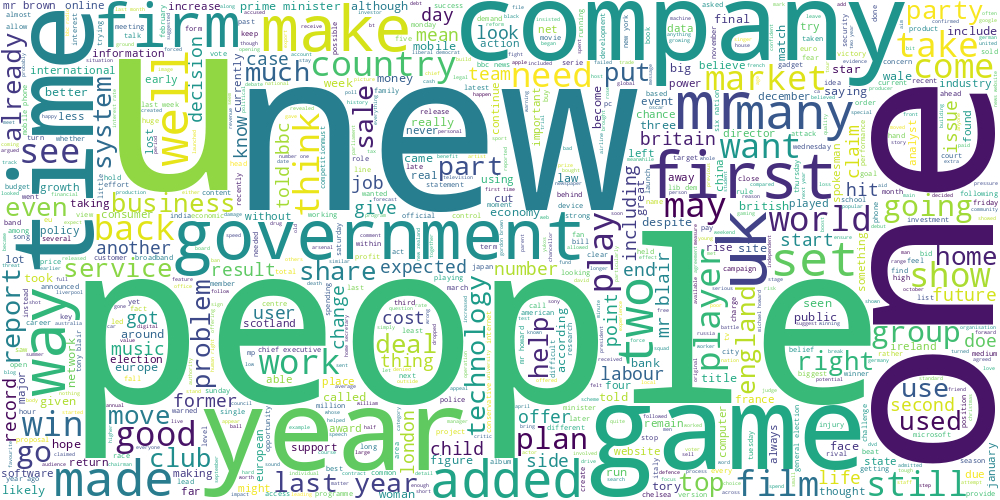

In [ ]:
draw_wordcloud(data.text)

**Задание 2.1 (1 балл).** Обучите алгоритм K-Means на tf-idf представлениях текстов. При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова, а также воздержитесь от использования N-грамм. Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8). Постройте облака тегов для текстов из разных кластеров.

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

# dекторизация TF-IDF
vectorizer = TfidfVectorizer(max_df=0.75, min_df=10, stop_words='english') # max_df,min_df - для болрьбы с шумом, удаляют слишком общие и слишком редкие слова. stop_words - удаляет стандартные английские стоп-слова, по типу it is и тд
X = vectorizer.fit_transform(data['text'])

# кластеризация
n_clust = 8
km = KMeans(n_clusters=n_clust, random_state=42)
km.fit(X)
data['cluster_kmean'] = km.labels_

Визуализация:

Cluster 0


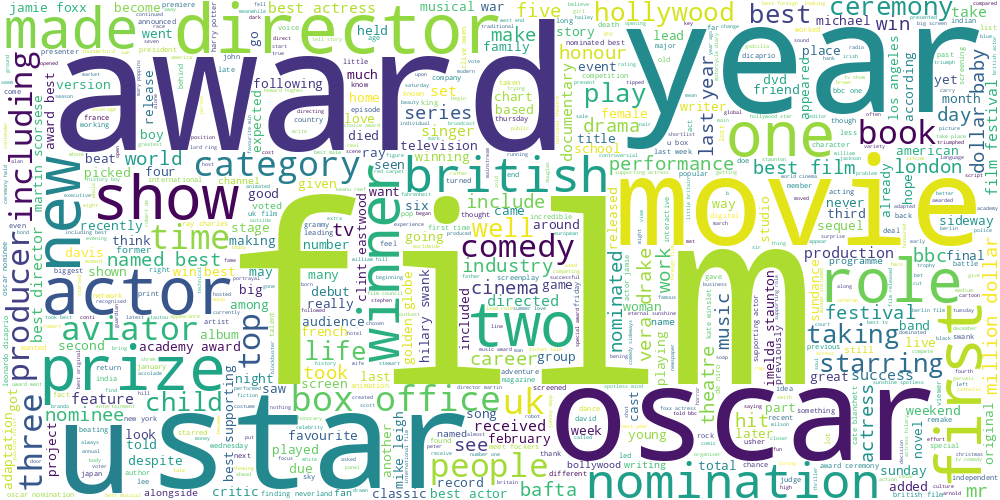

Cluster 1


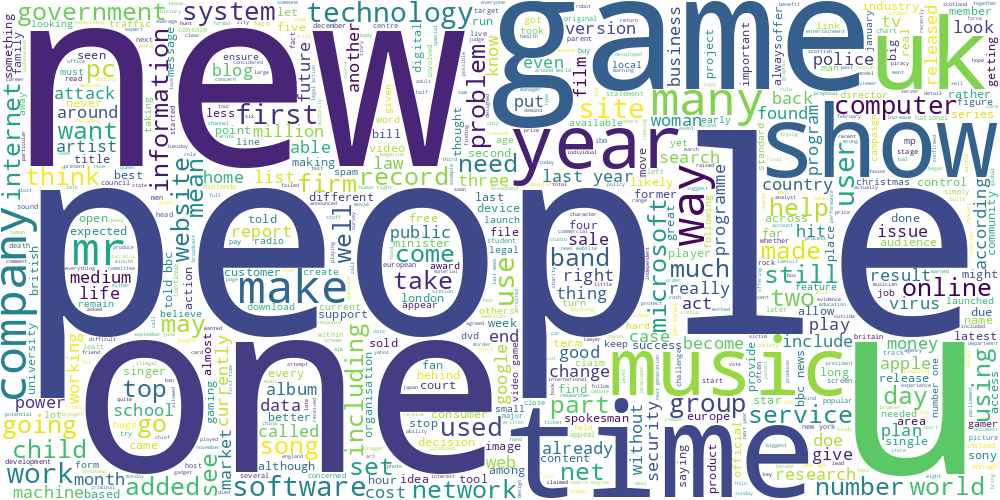

Cluster 2


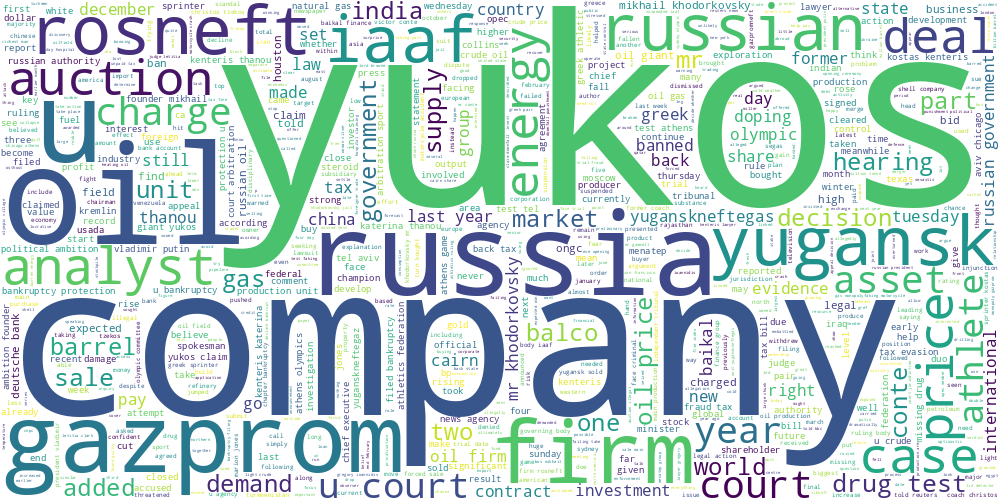

Cluster 3


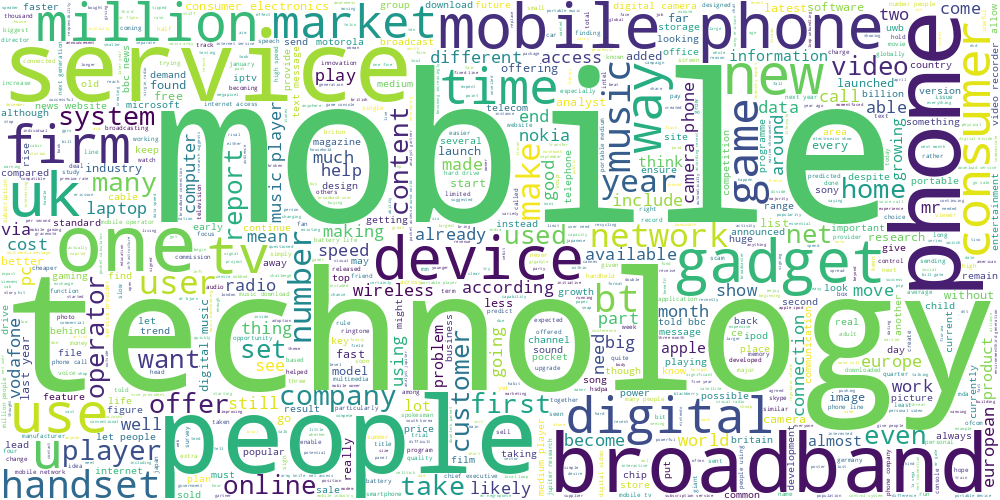

Cluster 4


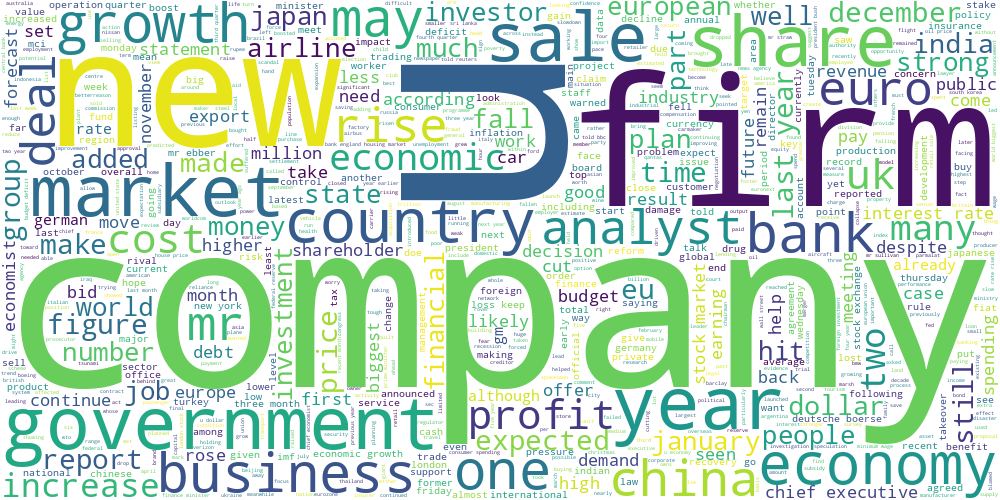

Cluster 5


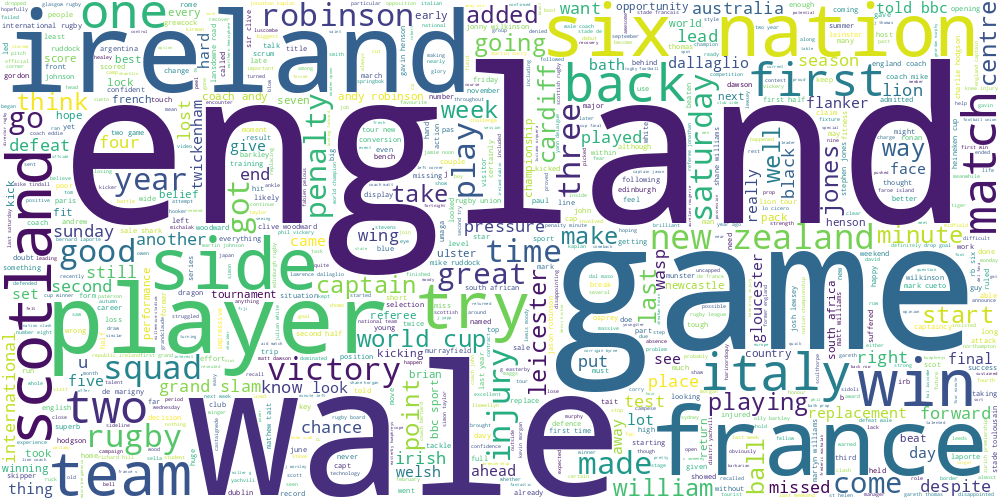

Cluster 6


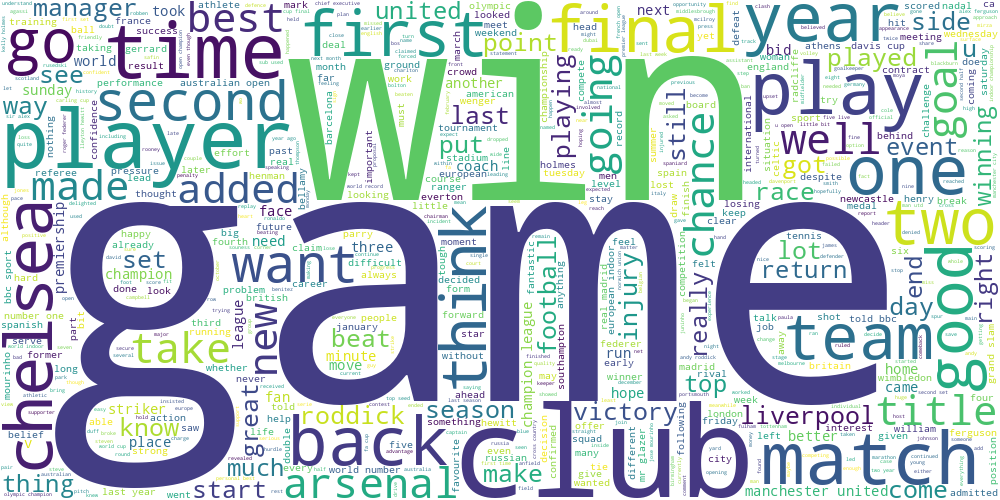

Cluster 7


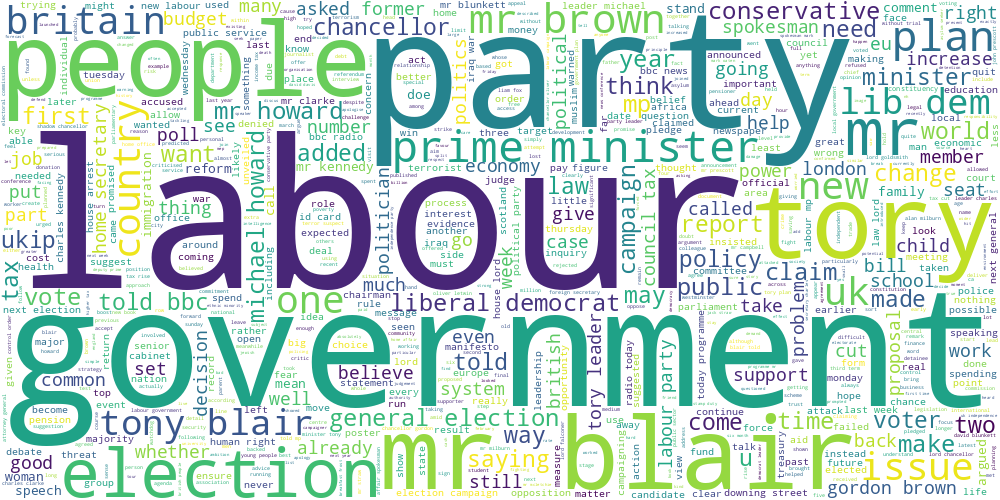

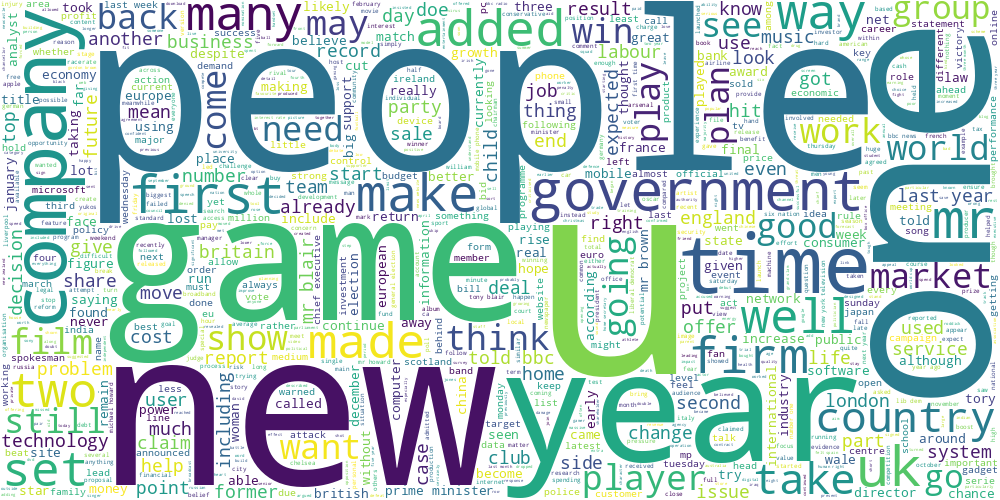

In [ ]:
for cluster_id in range(n_clust):
    print(f"Cluster {cluster_id}")
    display(draw_wordcloud(data[data['cluster_kmean'] == cluster_id]['text']))

draw_wordcloud(data.text)

Получились ли темы интерпретируемыми? Попробуйте озаглавить каждую тему.

**Ответ:**
В целом темы интерпретируемы, во многих облаках можно четко разглядеть оперделенную тематику:

* Cluster 0 — Кино и награды

* Cluster 1 — Люди и игры.. (пока не особо понятно)

* Cluster 2 — Энергетика и компании (обсуждения России)

* Cluster 3 — Технологии

* Cluster 4 — Экономика и рынки

* Cluster 5 — Про Европу

* Cluster 6 — Все про спорт, футбол и победы

* Cluster 7 — Политика и правительство

**Задание 2.2 (0.5 балла).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. Попробуйте взять центры кластеров и посмотреть на слова, для которых значения соответствующих им признаков максимальны.

In [ ]:
# слова-признаки из векторизатора
terms = vectorizer.get_feature_names_out()

top_keywords = {}
top_n = 10

for cluster_id, centroid in enumerate(km.cluster_centers_):
    top_terms = [terms[j] for j in centroid.argsort()[-top_n:][::-1]]
    top_keywords[f"Cluster {cluster_id}"] = top_terms

keywords_df = pd.DataFrame.from_dict(top_keywords, orient='index').transpose()
keywords_df

,Cluster 0,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Cluster 5,Cluster 6,Cluster 7
0,film,people,yukos,mobile,company,england,club,mr
1,award,music,oil,phone,market,wale,game,labour
2,best,game,russian,broadband,bank,ireland,champion,election
3,oscar,mr,kenteris,technology,growth,rugby,win,party
4,actor,new,iaaf,service,economy,france,chelsea,blair
5,star,computer,gazprom,digital,year,game,player,tory
6,festival,software,thanou,people,firm,nation,match,brown
7,actress,year,greek,gadget,share,robinson,cup,government
8,director,band,russia,music,sale,coach,season,minister
9,movie,site,test,device,rate,player,play,tax


Согласуются ли полученные слова с облаками тегов из прошлого задания?

**Ответ:** Да, в целом слова из центров кластеров хорошо согласуются с облаками по текстам

**Задание 2.3 (1.5 балла).** В первой части мы сравнили три разных алгоритма кластеризации на географических данных. Проделаем то же самое для текстовых данных (в качестве признакого описания снова используем tf-idf). Получите три разбиения на кластеры с помощью алгоритмов K-Means, DBSCAN и спектральной кластеризации (на этот раз воспользуйтесь реализацией из `sklearn`). Для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров, подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров (подумайте, как это можно сделать)

Далее, обучите двухмерные t-SNE представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом. Лучше всего расположить визуализации на одном графике на трех разных сабплотах. Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

**Обучаем k-mean:**

In [ ]:
n_clusters = 8
km = KMeans(n_clusters=n_clusters, random_state=42)
km_labels = km.fit_predict(X)

In [ ]:
data['km_labels'] = km_labels
cluster_counts = data['km_labels'].value_counts().sort_index()
cluster_counts

,count
km_labels,
0,186
1,606
2,66
3,117
4,454
5,130
6,369
7,297


**Обучаем dbscan на лучших параметрах:**

Я ввела метрику cosine вместо евклида, потому что с разреженными векторами угол (cosine) лучше отражает смысловую близость. Также увелисила eps, потому что при cosine почти все расстояния близки к 1, и с маленьким eps DBSCAN просто не видит плотностей — считает всё шумом.

Теперь мы можем отследить, что оптимальные параметры: eps = 0.5 и min_samples=4,но у нас получится слишком большое количество кластеров, поэтому я повысила порог min_samples до 9:

In [ ]:
study = optimize_clustering("dbscan", X, metric_dbscan='cosine', eps_min=0.4, eps_max=0.5)
study.best_params, study.best_value

[I 2025-04-13 19:20:19,048] A new study created in memory with name: no-name-f9c01914-f20e-4ae9-9baa-dc2555707515
[I 2025-04-13 19:20:19,049] A new study created in memory with name: no-name-26faa2df-350c-4565-a54c-637c8ee1f2da


Trial 0: eps=0.47500000000000003, min_samples=3, n_clusters=13


[I 2025-04-13 19:20:19,806] Trial 0 finished with value: -0.02041899094778146 and parameters: {'eps': 0.47500000000000003, 'min_samples': 3}. Best is trial 0 with value: -0.02041899094778146.
[I 2025-04-13 19:20:20,149] Trial 1 pruned. 


Trial 1: eps=0.48500000000000004, min_samples=5, n_clusters=1


[I 2025-04-13 19:20:20,496] Trial 2 pruned. 


Trial 2: eps=0.445, min_samples=5, n_clusters=1
Trial 3: eps=0.4, min_samples=3, n_clusters=5


[I 2025-04-13 19:20:21,193] Trial 3 finished with value: -0.015464936693013572 and parameters: {'eps': 0.4, 'min_samples': 3}. Best is trial 0 with value: -0.02041899094778146.
[I 2025-04-13 19:20:21,653] Trial 4 pruned. 


Trial 4: eps=0.405, min_samples=6, n_clusters=0
Trial 5: eps=0.445, min_samples=3, n_clusters=11


[I 2025-04-13 19:20:22,832] Trial 5 finished with value: -0.01844395056540841 and parameters: {'eps': 0.445, 'min_samples': 3}. Best is trial 0 with value: -0.02041899094778146.


Trial 6: eps=0.445, min_samples=3, n_clusters=11


[I 2025-04-13 19:20:24,247] Trial 6 finished with value: -0.01844395056540841 and parameters: {'eps': 0.445, 'min_samples': 3}. Best is trial 0 with value: -0.02041899094778146.


Trial 7: eps=0.47000000000000003, min_samples=4, n_clusters=7


[I 2025-04-13 19:20:25,106] Trial 7 finished with value: -0.01465414142602723 and parameters: {'eps': 0.47000000000000003, 'min_samples': 4}. Best is trial 0 with value: -0.02041899094778146.


Trial 8: eps=0.495, min_samples=4, n_clusters=8


[I 2025-04-13 19:20:26,035] Trial 8 finished with value: -0.013904744255372161 and parameters: {'eps': 0.495, 'min_samples': 4}. Best is trial 0 with value: -0.02041899094778146.
[I 2025-04-13 19:20:26,514] Trial 9 pruned. 


Trial 9: eps=0.47500000000000003, min_samples=5, n_clusters=1
Trial 10: eps=0.42500000000000004, min_samples=2, n_clusters=202


[I 2025-04-13 19:20:27,466] Trial 10 finished with value: 0.06512397850240143 and parameters: {'eps': 0.42500000000000004, 'min_samples': 2}. Best is trial 0 with value: -0.02041899094778146.


Trial 11: eps=0.46, min_samples=2, n_clusters=211


[I 2025-04-13 19:20:28,412] Trial 11 finished with value: 0.0673474275857115 and parameters: {'eps': 0.46, 'min_samples': 2}. Best is trial 0 with value: -0.02041899094778146.


Trial 12: eps=0.43000000000000005, min_samples=3, n_clusters=10


[I 2025-04-13 19:20:29,352] Trial 12 finished with value: -0.01859755069163148 and parameters: {'eps': 0.43000000000000005, 'min_samples': 3}. Best is trial 0 with value: -0.02041899094778146.


Trial 13: eps=0.42500000000000004, min_samples=3, n_clusters=8


[I 2025-04-13 19:20:30,182] Trial 13 finished with value: -0.018509533298500785 and parameters: {'eps': 0.42500000000000004, 'min_samples': 3}. Best is trial 0 with value: -0.02041899094778146.


Trial 14: eps=0.43000000000000005, min_samples=2, n_clusters=205


[I 2025-04-13 19:20:31,198] Trial 14 finished with value: 0.06427161004179542 and parameters: {'eps': 0.43000000000000005, 'min_samples': 2}. Best is trial 0 with value: -0.02041899094778146.


Trial 15: eps=0.495, min_samples=4, n_clusters=8


[I 2025-04-13 19:20:32,117] Trial 15 finished with value: -0.013904744255372161 and parameters: {'eps': 0.495, 'min_samples': 4}. Best is trial 0 with value: -0.02041899094778146.


Trial 16: eps=0.46, min_samples=3, n_clusters=12


[I 2025-04-13 19:20:33,044] Trial 16 finished with value: -0.02046338696316077 and parameters: {'eps': 0.46, 'min_samples': 3}. Best is trial 16 with value: -0.02046338696316077.


Trial 17: eps=0.46, min_samples=4, n_clusters=6


[I 2025-04-13 19:20:33,977] Trial 17 finished with value: -0.014659853593941962 and parameters: {'eps': 0.46, 'min_samples': 4}. Best is trial 16 with value: -0.02046338696316077.


Trial 18: eps=0.48000000000000004, min_samples=2, n_clusters=216


[I 2025-04-13 19:20:34,941] Trial 18 finished with value: 0.0698101938284254 and parameters: {'eps': 0.48000000000000004, 'min_samples': 2}. Best is trial 16 with value: -0.02046338696316077.


Trial 19: eps=0.46, min_samples=3, n_clusters=12


[I 2025-04-13 19:20:35,853] Trial 19 finished with value: -0.02046338696316077 and parameters: {'eps': 0.46, 'min_samples': 3}. Best is trial 16 with value: -0.02046338696316077.


Trial 20: eps=0.46, min_samples=4, n_clusters=6


[I 2025-04-13 19:20:36,778] Trial 20 finished with value: -0.014659853593941962 and parameters: {'eps': 0.46, 'min_samples': 4}. Best is trial 16 with value: -0.02046338696316077.


Trial 21: eps=0.465, min_samples=3, n_clusters=12


[I 2025-04-13 19:20:37,462] Trial 21 finished with value: -0.02046338696316077 and parameters: {'eps': 0.465, 'min_samples': 3}. Best is trial 16 with value: -0.02046338696316077.


Trial 22: eps=0.455, min_samples=3, n_clusters=11


[I 2025-04-13 19:20:38,155] Trial 22 finished with value: -0.01821945578743761 and parameters: {'eps': 0.455, 'min_samples': 3}. Best is trial 16 with value: -0.02046338696316077.


Trial 23: eps=0.465, min_samples=2, n_clusters=214


[I 2025-04-13 19:20:38,841] Trial 23 finished with value: 0.06856543972347702 and parameters: {'eps': 0.465, 'min_samples': 2}. Best is trial 16 with value: -0.02046338696316077.


Trial 24: eps=0.45, min_samples=3, n_clusters=11


[I 2025-04-13 19:20:39,521] Trial 24 finished with value: -0.01821945578743761 and parameters: {'eps': 0.45, 'min_samples': 3}. Best is trial 16 with value: -0.02046338696316077.


Trial 25: eps=0.48500000000000004, min_samples=3, n_clusters=15


[I 2025-04-13 19:20:40,215] Trial 25 finished with value: -0.02404409862011718 and parameters: {'eps': 0.48500000000000004, 'min_samples': 3}. Best is trial 25 with value: -0.02404409862011718.


Trial 26: eps=0.48500000000000004, min_samples=2, n_clusters=219


[I 2025-04-13 19:20:40,908] Trial 26 finished with value: 0.07247673084608466 and parameters: {'eps': 0.48500000000000004, 'min_samples': 2}. Best is trial 25 with value: -0.02404409862011718.


Trial 27: eps=0.5, min_samples=4, n_clusters=9


[I 2025-04-13 19:20:41,596] Trial 27 finished with value: -0.01462220604013321 and parameters: {'eps': 0.5, 'min_samples': 4}. Best is trial 25 with value: -0.02404409862011718.


Trial 28: eps=0.48500000000000004, min_samples=3, n_clusters=15


[I 2025-04-13 19:20:42,283] Trial 28 finished with value: -0.02404409862011718 and parameters: {'eps': 0.48500000000000004, 'min_samples': 3}. Best is trial 25 with value: -0.02404409862011718.


Trial 29: eps=0.49, min_samples=4, n_clusters=8


[I 2025-04-13 19:20:43,216] Trial 29 finished with value: -0.014231465434181453 and parameters: {'eps': 0.49, 'min_samples': 4}. Best is trial 25 with value: -0.02404409862011718.


Trial 30: eps=0.48000000000000004, min_samples=3, n_clusters=14


[I 2025-04-13 19:20:44,182] Trial 30 finished with value: -0.024267433072685935 and parameters: {'eps': 0.48000000000000004, 'min_samples': 3}. Best is trial 30 with value: -0.024267433072685935.


Trial 31: eps=0.47500000000000003, min_samples=3, n_clusters=13


[I 2025-04-13 19:20:45,125] Trial 31 finished with value: -0.02041899094778146 and parameters: {'eps': 0.47500000000000003, 'min_samples': 3}. Best is trial 30 with value: -0.024267433072685935.


Trial 32: eps=0.48500000000000004, min_samples=3, n_clusters=15


[I 2025-04-13 19:20:46,043] Trial 32 finished with value: -0.02404409862011718 and parameters: {'eps': 0.48500000000000004, 'min_samples': 3}. Best is trial 30 with value: -0.024267433072685935.
[I 2025-04-13 19:20:46,395] Trial 33 pruned. 


Trial 33: eps=0.48500000000000004, min_samples=5, n_clusters=1
Trial 34: eps=0.48000000000000004, min_samples=3, n_clusters=14


[I 2025-04-13 19:20:47,294] Trial 34 finished with value: -0.024267433072685935 and parameters: {'eps': 0.48000000000000004, 'min_samples': 3}. Best is trial 30 with value: -0.024267433072685935.
[I 2025-04-13 19:20:47,840] Trial 35 pruned. 


Trial 35: eps=0.5, min_samples=6, n_clusters=1
Trial 36: eps=0.48000000000000004, min_samples=2, n_clusters=216


[I 2025-04-13 19:20:49,209] Trial 36 finished with value: 0.0698101938284254 and parameters: {'eps': 0.48000000000000004, 'min_samples': 2}. Best is trial 30 with value: -0.024267433072685935.


Trial 37: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:20:50,333] Trial 37 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 37 with value: -0.024366729005371124.
[I 2025-04-13 19:20:50,809] Trial 38 pruned. 


Trial 38: eps=0.495, min_samples=5, n_clusters=1
Trial 39: eps=0.47000000000000003, min_samples=3, n_clusters=13


[I 2025-04-13 19:20:51,750] Trial 39 finished with value: -0.02041899094778146 and parameters: {'eps': 0.47000000000000003, 'min_samples': 3}. Best is trial 37 with value: -0.024366729005371124.


Trial 40: eps=0.47500000000000003, min_samples=4, n_clusters=8


[I 2025-04-13 19:20:52,667] Trial 40 finished with value: -0.015709373601122147 and parameters: {'eps': 0.47500000000000003, 'min_samples': 4}. Best is trial 37 with value: -0.024366729005371124.


Trial 41: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:20:53,541] Trial 41 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 37 with value: -0.024366729005371124.


Trial 42: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:20:54,213] Trial 42 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 37 with value: -0.024366729005371124.


Trial 43: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:20:54,902] Trial 43 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 37 with value: -0.024366729005371124.


Trial 44: eps=0.49, min_samples=2, n_clusters=223


[I 2025-04-13 19:20:55,593] Trial 44 finished with value: 0.0741983842626987 and parameters: {'eps': 0.49, 'min_samples': 2}. Best is trial 37 with value: -0.024366729005371124.


Trial 45: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:20:56,269] Trial 45 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 37 with value: -0.024366729005371124.


Trial 46: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:20:56,942] Trial 46 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 47: eps=0.5, min_samples=2, n_clusters=228


[I 2025-04-13 19:20:57,630] Trial 47 finished with value: 0.07652910494180301 and parameters: {'eps': 0.5, 'min_samples': 2}. Best is trial 46 with value: -0.024667018426696764.


Trial 48: eps=0.495, min_samples=4, n_clusters=8


[I 2025-04-13 19:20:58,326] Trial 48 finished with value: -0.013904744255372161 and parameters: {'eps': 0.495, 'min_samples': 4}. Best is trial 46 with value: -0.024667018426696764.


Trial 49: eps=0.49, min_samples=4, n_clusters=8


[I 2025-04-13 19:20:59,012] Trial 49 finished with value: -0.014231465434181453 and parameters: {'eps': 0.49, 'min_samples': 4}. Best is trial 46 with value: -0.024667018426696764.


Trial 50: eps=0.41000000000000003, min_samples=3, n_clusters=6


[I 2025-04-13 19:20:59,702] Trial 50 finished with value: -0.018113861674842986 and parameters: {'eps': 0.41000000000000003, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 51: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:21:00,640] Trial 51 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 52: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:01,568] Trial 52 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 53: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:02,408] Trial 53 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 54: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:03,099] Trial 54 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 55: eps=0.495, min_samples=2, n_clusters=224


[I 2025-04-13 19:21:03,789] Trial 55 finished with value: 0.07494437104346333 and parameters: {'eps': 0.495, 'min_samples': 2}. Best is trial 46 with value: -0.024667018426696764.


Trial 56: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:04,477] Trial 56 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 57: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:05,165] Trial 57 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 58: eps=0.495, min_samples=4, n_clusters=8


[I 2025-04-13 19:21:05,854] Trial 58 finished with value: -0.013904744255372161 and parameters: {'eps': 0.495, 'min_samples': 4}. Best is trial 46 with value: -0.024667018426696764.


Trial 59: eps=0.47000000000000003, min_samples=3, n_clusters=13


[I 2025-04-13 19:21:06,533] Trial 59 finished with value: -0.02041899094778146 and parameters: {'eps': 0.47000000000000003, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 60: eps=0.495, min_samples=2, n_clusters=224


[I 2025-04-13 19:21:07,229] Trial 60 finished with value: 0.07494437104346333 and parameters: {'eps': 0.495, 'min_samples': 2}. Best is trial 46 with value: -0.024667018426696764.


Trial 61: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:07,917] Trial 61 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 62: eps=0.44, min_samples=3, n_clusters=11


[I 2025-04-13 19:21:08,597] Trial 62 finished with value: -0.019331644704702944 and parameters: {'eps': 0.44, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 63: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:09,280] Trial 63 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 64: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:09,967] Trial 64 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 65: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:11,224] Trial 65 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 66: eps=0.495, min_samples=4, n_clusters=8


[I 2025-04-13 19:21:11,919] Trial 66 finished with value: -0.013904744255372161 and parameters: {'eps': 0.495, 'min_samples': 4}. Best is trial 46 with value: -0.024667018426696764.


Trial 67: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:12,751] Trial 67 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 68: eps=0.48500000000000004, min_samples=3, n_clusters=15


[I 2025-04-13 19:21:13,712] Trial 68 finished with value: -0.02404409862011718 and parameters: {'eps': 0.48500000000000004, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 69: eps=0.495, min_samples=2, n_clusters=224


[I 2025-04-13 19:21:14,665] Trial 69 finished with value: 0.07494437104346333 and parameters: {'eps': 0.495, 'min_samples': 2}. Best is trial 46 with value: -0.024667018426696764.


Trial 70: eps=0.48000000000000004, min_samples=3, n_clusters=14


[I 2025-04-13 19:21:15,389] Trial 70 finished with value: -0.024267433072685935 and parameters: {'eps': 0.48000000000000004, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 71: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:16,096] Trial 71 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 72: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:16,795] Trial 72 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 73: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:17,504] Trial 73 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 74: eps=0.48500000000000004, min_samples=3, n_clusters=15


[I 2025-04-13 19:21:18,210] Trial 74 finished with value: -0.02404409862011718 and parameters: {'eps': 0.48500000000000004, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 75: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:18,896] Trial 75 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 76: eps=0.48500000000000004, min_samples=3, n_clusters=15


[I 2025-04-13 19:21:19,602] Trial 76 finished with value: -0.02404409862011718 and parameters: {'eps': 0.48500000000000004, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 77: eps=0.5, min_samples=4, n_clusters=9


[I 2025-04-13 19:21:20,309] Trial 77 finished with value: -0.01462220604013321 and parameters: {'eps': 0.5, 'min_samples': 4}. Best is trial 46 with value: -0.024667018426696764.


Trial 78: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:21,003] Trial 78 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 79: eps=0.49, min_samples=2, n_clusters=223


[I 2025-04-13 19:21:21,717] Trial 79 finished with value: 0.0741983842626987 and parameters: {'eps': 0.49, 'min_samples': 2}. Best is trial 46 with value: -0.024667018426696764.


Trial 80: eps=0.48500000000000004, min_samples=4, n_clusters=8


[I 2025-04-13 19:21:22,420] Trial 80 finished with value: -0.014597401829950334 and parameters: {'eps': 0.48500000000000004, 'min_samples': 4}. Best is trial 46 with value: -0.024667018426696764.


Trial 81: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:23,123] Trial 81 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 82: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:23,815] Trial 82 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 83: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:24,516] Trial 83 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 84: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:21:25,374] Trial 84 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 85: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:26,291] Trial 85 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 86: eps=0.48000000000000004, min_samples=3, n_clusters=14


[I 2025-04-13 19:21:27,230] Trial 86 finished with value: -0.024267433072685935 and parameters: {'eps': 0.48000000000000004, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 87: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:27,943] Trial 87 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 88: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:21:28,645] Trial 88 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 89: eps=0.48500000000000004, min_samples=3, n_clusters=15


[I 2025-04-13 19:21:29,344] Trial 89 finished with value: -0.02404409862011718 and parameters: {'eps': 0.48500000000000004, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 90: eps=0.42000000000000004, min_samples=3, n_clusters=8


[I 2025-04-13 19:21:30,046] Trial 90 finished with value: -0.019433564977781103 and parameters: {'eps': 0.42000000000000004, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 91: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:30,751] Trial 91 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 92: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:21:31,464] Trial 92 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.
[I 2025-04-13 19:21:31,827] Trial 93 pruned. 


Trial 93: eps=0.495, min_samples=6, n_clusters=1
Trial 94: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:32,541] Trial 94 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 95: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:21:33,268] Trial 95 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 96: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:33,977] Trial 96 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 97: eps=0.47500000000000003, min_samples=3, n_clusters=13


[I 2025-04-13 19:21:34,684] Trial 97 finished with value: -0.02041899094778146 and parameters: {'eps': 0.47500000000000003, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 98: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:35,401] Trial 98 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 99: eps=0.495, min_samples=2, n_clusters=224


[I 2025-04-13 19:21:36,127] Trial 99 finished with value: 0.07494437104346333 and parameters: {'eps': 0.495, 'min_samples': 2}. Best is trial 46 with value: -0.024667018426696764.


Trial 100: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:21:36,834] Trial 100 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 101: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:37,624] Trial 101 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 102: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:38,560] Trial 102 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 103: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:39,514] Trial 103 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 104: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:21:40,326] Trial 104 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 105: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:41,035] Trial 105 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 106: eps=0.48500000000000004, min_samples=3, n_clusters=15


[I 2025-04-13 19:21:41,736] Trial 106 finished with value: -0.02404409862011718 and parameters: {'eps': 0.48500000000000004, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 107: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:42,444] Trial 107 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 108: eps=0.49, min_samples=4, n_clusters=8


[I 2025-04-13 19:21:43,143] Trial 108 finished with value: -0.014231465434181453 and parameters: {'eps': 0.49, 'min_samples': 4}. Best is trial 46 with value: -0.024667018426696764.


Trial 109: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:43,837] Trial 109 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 110: eps=0.455, min_samples=3, n_clusters=11


[I 2025-04-13 19:21:44,549] Trial 110 finished with value: -0.01821945578743761 and parameters: {'eps': 0.455, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 111: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:45,255] Trial 111 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 112: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:45,948] Trial 112 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 113: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:21:46,659] Trial 113 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 114: eps=0.4, min_samples=3, n_clusters=5


[I 2025-04-13 19:21:47,362] Trial 114 finished with value: -0.015464936693013572 and parameters: {'eps': 0.4, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 115: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:48,060] Trial 115 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 116: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:48,771] Trial 116 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 117: eps=0.44, min_samples=3, n_clusters=11


[I 2025-04-13 19:21:49,478] Trial 117 finished with value: -0.019331644704702944 and parameters: {'eps': 0.44, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 118: eps=0.48500000000000004, min_samples=3, n_clusters=15


[I 2025-04-13 19:21:50,285] Trial 118 finished with value: -0.02404409862011718 and parameters: {'eps': 0.48500000000000004, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 119: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:21:51,214] Trial 119 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 120: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:52,161] Trial 120 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 121: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:52,971] Trial 121 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 122: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:53,678] Trial 122 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 123: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:54,379] Trial 123 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 124: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:21:55,089] Trial 124 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 125: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:55,802] Trial 125 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.
[I 2025-04-13 19:21:56,169] Trial 126 pruned. 


Trial 126: eps=0.5, min_samples=5, n_clusters=1
Trial 127: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:21:56,879] Trial 127 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 128: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:57,590] Trial 128 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 129: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:58,289] Trial 129 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 130: eps=0.48500000000000004, min_samples=3, n_clusters=15


[I 2025-04-13 19:21:58,990] Trial 130 finished with value: -0.02404409862011718 and parameters: {'eps': 0.48500000000000004, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 131: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:21:59,709] Trial 131 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 132: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:00,416] Trial 132 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 133: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:22:01,123] Trial 133 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 134: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:01,826] Trial 134 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 135: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:02,528] Trial 135 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 136: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:22:03,464] Trial 136 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 137: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:04,423] Trial 137 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 138: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:05,299] Trial 138 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 139: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:22:06,015] Trial 139 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 140: eps=0.495, min_samples=2, n_clusters=224


[I 2025-04-13 19:22:06,720] Trial 140 finished with value: 0.07494437104346333 and parameters: {'eps': 0.495, 'min_samples': 2}. Best is trial 46 with value: -0.024667018426696764.


Trial 141: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:07,420] Trial 141 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 142: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:08,126] Trial 142 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 143: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:08,827] Trial 143 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 144: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:22:09,531] Trial 144 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 145: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:10,234] Trial 145 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 146: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:10,929] Trial 146 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 147: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:22:11,633] Trial 147 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 148: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:12,350] Trial 148 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 149: eps=0.48500000000000004, min_samples=3, n_clusters=15


[I 2025-04-13 19:22:13,061] Trial 149 finished with value: -0.02404409862011718 and parameters: {'eps': 0.48500000000000004, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 150: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:13,757] Trial 150 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 151: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:14,467] Trial 151 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 152: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:15,221] Trial 152 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 153: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:16,171] Trial 153 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 154: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:22:17,104] Trial 154 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 155: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:17,950] Trial 155 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 156: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:22:18,658] Trial 156 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 157: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:19,363] Trial 157 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 158: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:20,060] Trial 158 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 159: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:20,761] Trial 159 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 160: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:22:21,469] Trial 160 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 161: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:22,168] Trial 161 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 162: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:22,868] Trial 162 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 163: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:23,588] Trial 163 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 164: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:24,280] Trial 164 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 165: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:22:24,984] Trial 165 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 166: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:25,704] Trial 166 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 167: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:22:26,408] Trial 167 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 168: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:27,109] Trial 168 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 169: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:27,860] Trial 169 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 170: eps=0.42000000000000004, min_samples=3, n_clusters=8


[I 2025-04-13 19:22:28,824] Trial 170 finished with value: -0.019433564977781103 and parameters: {'eps': 0.42000000000000004, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 171: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:29,789] Trial 171 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 172: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:30,606] Trial 172 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 173: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:31,316] Trial 173 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 174: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:22:32,018] Trial 174 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 175: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:32,718] Trial 175 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 176: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:33,422] Trial 176 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 177: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:34,130] Trial 177 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 178: eps=0.465, min_samples=3, n_clusters=12


[I 2025-04-13 19:22:34,837] Trial 178 finished with value: -0.02046338696316077 and parameters: {'eps': 0.465, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 179: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:22:35,545] Trial 179 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.
[I 2025-04-13 19:22:35,916] Trial 180 pruned. 


Trial 180: eps=0.495, min_samples=6, n_clusters=1
Trial 181: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:36,618] Trial 181 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 182: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:37,323] Trial 182 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 183: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:38,026] Trial 183 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 184: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:38,732] Trial 184 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 185: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:22:39,435] Trial 185 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 186: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:40,143] Trial 186 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 187: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:41,052] Trial 187 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 188: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:22:41,979] Trial 188 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 189: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:42,907] Trial 189 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 190: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:43,619] Trial 190 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 191: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:44,335] Trial 191 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 192: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:45,046] Trial 192 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 193: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:45,752] Trial 193 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 194: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:22:46,461] Trial 194 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 195: eps=0.45, min_samples=3, n_clusters=11


[I 2025-04-13 19:22:47,175] Trial 195 finished with value: -0.01821945578743761 and parameters: {'eps': 0.45, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 196: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:47,881] Trial 196 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 197: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:48,591] Trial 197 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 198: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:49,298] Trial 198 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 199: eps=0.43500000000000005, min_samples=3, n_clusters=11


[I 2025-04-13 19:22:49,996] Trial 199 finished with value: -0.019331644704702944 and parameters: {'eps': 0.43500000000000005, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 200: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:22:50,706] Trial 200 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 201: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:51,419] Trial 201 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 202: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:52,122] Trial 202 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.
[I 2025-04-13 19:22:52,487] Trial 203 pruned. 


Trial 203: eps=0.5, min_samples=5, n_clusters=1
Trial 204: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:53,328] Trial 204 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 205: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:22:54,269] Trial 205 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 206: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:55,244] Trial 206 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 207: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:56,003] Trial 207 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 208: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:56,721] Trial 208 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 209: eps=0.47000000000000003, min_samples=3, n_clusters=13


[I 2025-04-13 19:22:57,422] Trial 209 finished with value: -0.02041899094778146 and parameters: {'eps': 0.47000000000000003, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 210: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:22:58,131] Trial 210 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 211: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:58,842] Trial 211 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 212: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:22:59,553] Trial 212 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 213: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:00,277] Trial 213 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 214: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:00,995] Trial 214 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 215: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:01,707] Trial 215 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 216: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:23:02,413] Trial 216 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 217: eps=0.455, min_samples=3, n_clusters=11


[I 2025-04-13 19:23:03,116] Trial 217 finished with value: -0.01821945578743761 and parameters: {'eps': 0.455, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 218: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:03,820] Trial 218 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 219: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:04,523] Trial 219 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 220: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:23:05,231] Trial 220 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 221: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:06,129] Trial 221 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 222: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:07,071] Trial 222 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 223: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:08,010] Trial 223 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 224: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:08,720] Trial 224 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 225: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:09,430] Trial 225 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 226: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:23:10,141] Trial 226 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 227: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:10,842] Trial 227 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 228: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:11,559] Trial 228 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 229: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:12,267] Trial 229 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 230: eps=0.41000000000000003, min_samples=3, n_clusters=6


[I 2025-04-13 19:23:12,957] Trial 230 finished with value: -0.018113861674842986 and parameters: {'eps': 0.41000000000000003, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 231: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:13,658] Trial 231 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 232: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:14,365] Trial 232 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 233: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:15,073] Trial 233 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 234: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:23:15,783] Trial 234 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 235: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:16,497] Trial 235 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 236: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:23:17,212] Trial 236 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 237: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:17,920] Trial 237 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 238: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:18,850] Trial 238 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 239: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:19,815] Trial 239 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 240: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:23:20,720] Trial 240 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 241: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:21,437] Trial 241 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 242: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:22,140] Trial 242 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 243: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:22,846] Trial 243 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 244: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:23,581] Trial 244 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 245: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:24,282] Trial 245 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 246: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:24,988] Trial 246 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 247: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:23:25,698] Trial 247 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 248: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:26,413] Trial 248 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 249: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:27,119] Trial 249 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 250: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:27,827] Trial 250 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 251: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:23:28,534] Trial 251 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 252: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:29,240] Trial 252 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 253: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:29,949] Trial 253 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 254: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:30,680] Trial 254 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 255: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:23:31,628] Trial 255 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 256: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:32,561] Trial 256 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 257: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:33,417] Trial 257 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 258: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:34,121] Trial 258 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 259: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:23:34,823] Trial 259 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 260: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:35,544] Trial 260 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 261: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:36,267] Trial 261 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 262: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:36,972] Trial 262 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 263: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:23:37,680] Trial 263 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 264: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:38,396] Trial 264 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 265: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:39,115] Trial 265 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 266: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:39,811] Trial 266 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 267: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:23:40,529] Trial 267 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 268: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:41,246] Trial 268 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 269: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:41,945] Trial 269 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 270: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:42,648] Trial 270 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 271: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:43,434] Trial 271 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 272: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:44,368] Trial 272 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 273: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:23:45,337] Trial 273 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 274: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:46,149] Trial 274 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 275: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:46,842] Trial 275 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 276: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:47,550] Trial 276 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 277: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:23:48,252] Trial 277 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 278: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:48,951] Trial 278 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 279: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:49,655] Trial 279 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 280: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:50,361] Trial 280 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 281: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:23:51,068] Trial 281 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 282: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:51,773] Trial 282 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 283: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:23:52,486] Trial 283 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 284: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:53,190] Trial 284 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 285: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:53,910] Trial 285 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 286: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:54,621] Trial 286 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 287: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:55,319] Trial 287 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 288: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:56,152] Trial 288 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 289: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:23:57,092] Trial 289 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 290: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:58,034] Trial 290 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 291: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:23:58,793] Trial 291 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 292: eps=0.5, min_samples=3, n_clusters=18


[I 2025-04-13 19:23:59,495] Trial 292 finished with value: -0.024219082382253388 and parameters: {'eps': 0.5, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 293: eps=0.48500000000000004, min_samples=3, n_clusters=15


[I 2025-04-13 19:24:00,226] Trial 293 finished with value: -0.02404409862011718 and parameters: {'eps': 0.48500000000000004, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 294: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:24:00,938] Trial 294 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 295: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:24:01,646] Trial 295 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 296: eps=0.5, min_samples=4, n_clusters=9


[I 2025-04-13 19:24:02,348] Trial 296 finished with value: -0.01462220604013321 and parameters: {'eps': 0.5, 'min_samples': 4}. Best is trial 46 with value: -0.024667018426696764.


Trial 297: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:24:03,049] Trial 297 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 298: eps=0.49, min_samples=3, n_clusters=16


[I 2025-04-13 19:24:03,744] Trial 298 finished with value: -0.024366729005371124 and parameters: {'eps': 0.49, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


Trial 299: eps=0.495, min_samples=3, n_clusters=18


[I 2025-04-13 19:24:04,447] Trial 299 finished with value: -0.024667018426696764 and parameters: {'eps': 0.495, 'min_samples': 3}. Best is trial 46 with value: -0.024667018426696764.


({'eps': 0.495, 'min_samples': 3}, -0.024667018426696764)

In [ ]:
db = DBSCAN(eps=0.495, min_samples=9, metric='cosine')
db_labels = db.fit_predict(X)

In [ ]:
data['db_labels'] = db_labels
cluster_counts = data['db_labels'].value_counts().sort_index()
cluster_counts

,count
db_labels,
-1,2108
0,18
1,10
2,19
3,11
4,16
5,14
6,9
7,9


**Обучаем spectral:**

In [ ]:
from sklearn.cluster import SpectralClustering

sс = SpectralClustering(n_clusters=8, affinity='nearest_neighbors', random_state=42)
sс_labels = sс.fit_predict(X)

In [ ]:
data['sс_labels'] = db_labels
cluster_counts = data['sс_labels'].value_counts().sort_index()
cluster_counts

,count
sс_labels,
-1,2108
0,18
1,10
2,19
3,11
4,16
5,14
6,9
7,9


**t-SNE визуализация:**

In [ ]:
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE

svd = TruncatedSVD(n_components=50, random_state=42)
X_svd = svd.fit_transform(X)

tsne = TSNE(n_components=2, perplexity=30, init='pca', learning_rate='auto', random_state=42)
X_tsne = tsne.fit_transform(X_svd)

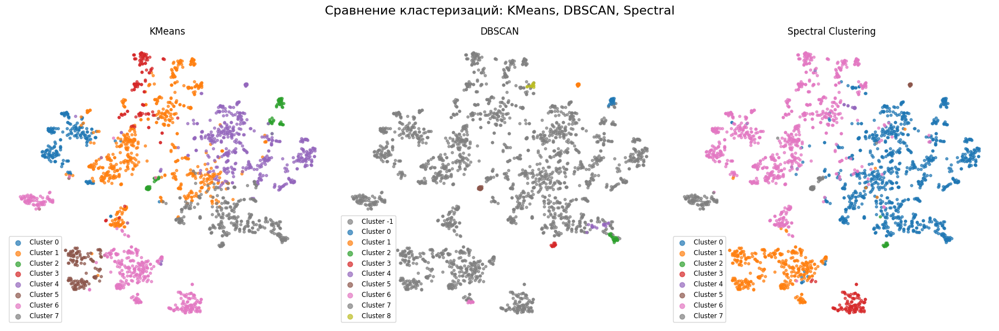

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
titles = ['KMeans', 'DBSCAN', 'Spectral Clustering']
label_sets = [km_labels, db_labels, sс_labels]

for ax, title, labels in zip(axes, titles, label_sets):
    for label in np.unique(labels):
        mask = labels == label
        color = 'gray' if label == -1 else None  # шум у DBSCAN
        ax.scatter(X_tsne[mask, 0], X_tsne[mask, 1], label=f"Cluster {label}", s=10, alpha=0.7, c=color)
    ax.set_title(title)
    ax.legend(loc='best', fontsize='small', markerscale=2)
    ax.axis('off')

plt.suptitle("Сравнение кластеризаций: KMeans, DBSCAN, Spectral", fontsize=16)
plt.tight_layout();

Прокомментируйте получившиеся результаты. Какой баланс кластеров получился у разных методов? Соотносятся ли визуализации для текстов с визуализациями для географических данных?

**Ответ:**

* KMeans дал в целом сбалансированные и чёткие кластеры, без сильного перекрытия. Почти все точки попали в кластеры. Структура как всегда похожа на "островки".

* DBSCAN — почти весь граф серый: большинство точек попали в шум (label = -1). Те точки, что попали в кластеры — действительно локально плотные. В целом ситуация такая-же, как и с картами.

* Spectral Clustering показал похожее поведение на KMeans, но шума вроде поменьше и кластеры покрупнее. Это объясняется тем, что Spectral лучше справляется с нелинейной формой кластеров.

KMeans и Spectral в целом согласованы между собой — видно, что "структура" данных похожа. Все графики достаточко схожи с тем, что было на картах.

**Задание 2.4 (1.5 балла).** Обучите модель латентного размещения Дирихле. Не забудьте, что она работает с мешком слов, а не с tf-idf признаками. Придумайте, как превратить распределение тем для текста в номер его кластера. Возьмите параметр `n_components` в 2-3 раза больше, чем число кластеров для K-Means.

In [ ]:
# векторизация мешковидная
from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer(max_df=0.75, min_df=10, stop_words='english')
X = vectorizer.fit_transform(data['text'])

X.shape

(2225, 4706)

n_components должно быть в 2–3 раза больше, чем число кластеров для K-Means, так что возьмем нечто среднее: n_components = 20

In [ ]:
# обучаем модель латентного дирихле
from sklearn.decomposition import LatentDirichletAllocation

n_components = 20
lda = LatentDirichletAllocation(n_components=n_components, random_state=42)
lda_kek = lda.fit_transform(X)

lda_kek.shape

(2225, 20)

В качестве темы кластера выбираем ту, у которой больше вероятность. Также для каждого кластера выделим топ слов, чтобы понимать основную тематику.

In [ ]:
data['lda_cluster'] = np.argmax(lda_kek, axis=1)
cluster_counts = data['lda_cluster'].value_counts().sort_index()

# топ-5 слов для каждой темы
terms = vectorizer.get_feature_names_out()
topic_names_fixed = {}
for topic_idx, topic in enumerate(lda.components_):
    top_features_idx = topic.argsort()[-5:][::-1]
    top_words = [terms[i] for i in top_features_idx]
    topic_names_fixed[topic_idx] = ', '.join(top_words)

summary = pd.DataFrame({
    'Topic': cluster_counts.index,
    'Documents': cluster_counts.values,
    'Top words': [topic_names_fixed[i] for i in cluster_counts.index]
}).set_index('Topic')

summary

,Documents,Top words
Topic,,
0,54,"lord, court, case, people, right"
1,43,"minute, ball, second, took, penalty"
2,32,"mr, ukip, india, year, uk"
3,114,"win, open, year, world, final"
4,276,"year, music, film, new, band"
5,174,"year, growth, economy, economic, price"
6,85,"england, ireland, rugby, france, nation"
7,37,"law, attack, police, right, government"
8,191,"club, player, game, league, chelsea"


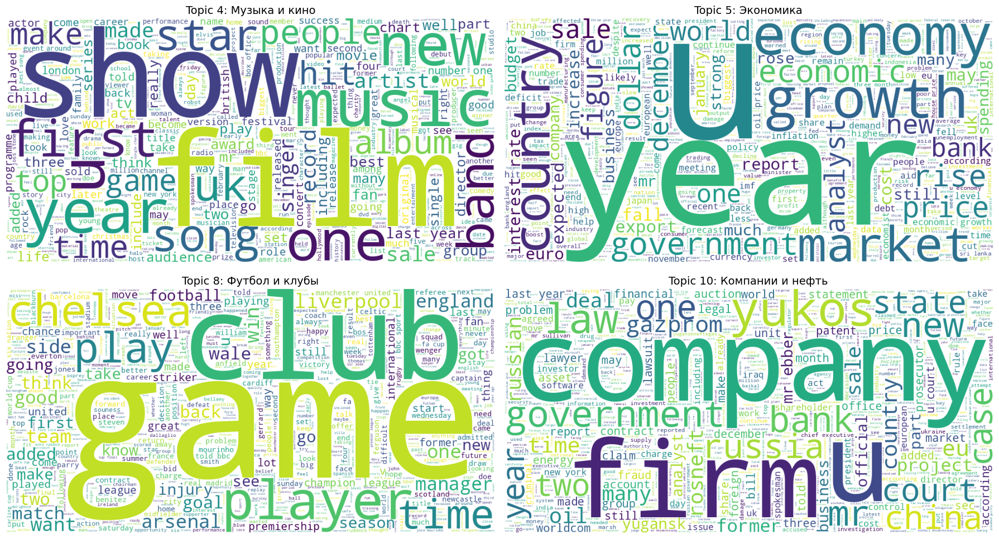

In [ ]:
topic_ids = [4, 5, 8, 10]  # Музыка/кино, экономика, футбол, компании/нефть
titles = [
    'Topic 4: Музыка и кино',
    'Topic 5: Экономика',
    'Topic 8: Футбол и клубы',
    'Topic 10: Компании и нефть'
]

fig, axes = plt.subplots(2, 2, figsize=(18, 10))

for ax, topic_id, title in zip(axes.ravel(), topic_ids, titles):
    texts_in_topic = data[data['lda_cluster'] == topic_id]['text']
    img = draw_wordcloud(texts_in_topic)
    ax.imshow(img)
    ax.axis('off')
    ax.set_title(title, fontsize=14)

plt.tight_layout();


Получились ли темы более узкими от такого нововведения? Постройте облака тегов для нескольких наиболее удачных тем.

**Ответ:**

Темы, полученные с помощью LDA, действительно оказались более узкими и смысловыми, чем при кластеризации KMeans. Если KMeans просто делит тексты по формальным признакам и плотностям в пространстве TF-IDF, то LDA старается понять, о чём тексты на самом деле, и группирует их по тематикам.

Например:

Тема 4 — про музыку и кино: show, music, film, song, band.

Тема 8 — всё про спорт и клубы: club, player, game, league, chelsea.

Тема 5 — касается экономики и роста: year, growth, economy, economic, price.

Тема 10 — про компании и нефть: company, firm, mr, oil, china.

## Часть 3. Transfer learning и Self-Supervised Learning для задачи классификации текстов

**Задание 3.1 (0.5 балла).** Вспомним, что у нас есть разметка для тематик статей. Попробуем обучить классификатор поверх unsupervised-представлений для текстов. Рассмотрите три модели:

* Логистическая регрессия на tf-idf признаках
* K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров
* Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

Разделите выборку на обучающую и тестовую, замерьте accuracy на обоих выборках для всех трех моделей. Параметры всех моделей возьмите равными значениям по умолчанию.

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

**Логистическая регрессия на tf-idf признаках**

In [ ]:
y = data['category']
vectorizer = TfidfVectorizer(max_df=0.75, min_df=10, stop_words='english') # max_df,min_df - для болрьбы с шумом, удаляют слишком общие и слишком редкие слова. stop_words - удаляет стандартные английские стоп-слова, по типу it is и тд
X = vectorizer.fit_transform(data['text'])

X_train_tfidf, X_test_tfidf, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

model_tfidf = LogisticRegression(max_iter=1000)
model_tfidf.fit(X_train_tfidf, y_train)

y_pred_train_tfidf = model_tfidf.predict(X_train_tfidf)
y_pred_test_tfidf = model_tfidf.predict(X_test_tfidf)

acc_train_tfidf = accuracy_score(y_train, y_pred_train_tfidf)
acc_test_tfidf = accuracy_score(y_test, y_pred_test_tfidf)
acc_train_tfidf, acc_test_tfidf

(0.9961464354527938, 0.9760479041916168)

**K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров**

In [ ]:
kmeans = KMeans(n_clusters=8, random_state=42)
kmeans.fit(X)
X_kmeans = kmeans.transform(X)

X_train_km, X_test_km, y_train_km, y_test_km = train_test_split(X_kmeans, y, test_size=0.3, random_state=42)

model_kmeans = LogisticRegression(max_iter=1000)
model_kmeans.fit(X_train_km, y_train_km)

y_pred_train_km = model_kmeans.predict(X_train_km)
y_pred_test_km = model_kmeans.predict(X_test_km)

acc_train_km = accuracy_score(y_train_km, y_pred_train_km)
acc_test_km = accuracy_score(y_test_km, y_pred_test_km)
acc_train_km, acc_test_km

(0.8246628131021194, 0.8083832335329342)

**Латентное размещение Дирихле + логистическая регрессия на вероятностях тем**

In [ ]:
vectorizer = CountVectorizer(max_df=0.75, min_df=10, stop_words='english')
X_vec = vectorizer.fit_transform(data['text'])

X_train_lda, X_test_lda, y_train_lda, y_test_lda = train_test_split(X_vec, y, test_size=0.3, random_state=42)

model_lda = LogisticRegression(max_iter=1000)
model_lda.fit(X_train_lda, y_train_lda)

y_pred_train_lda = model_lda.predict(X_train_lda)
y_pred_test_lda = model_lda.predict(X_test_lda)

acc_train_lda = accuracy_score(y_train_lda, y_pred_train_lda)
acc_test_lda = accuracy_score(y_test_lda, y_pred_test_lda)
acc_train_lda, acc_test_lda

(1.0, 0.9670658682634731)

In [ ]:
accuracy_df = pd.DataFrame({
    'Train Accuracy': [acc_train_tfidf, acc_train_km, acc_train_lda],
    'Test Accuracy': [acc_test_tfidf, acc_test_km, acc_test_lda]
}, index=['TF-IDF + LogisticRegression', 'KMeans + LogisticRegression', 'LDA + LogisticRegression'])

accuracy_df

,Train Accuracy,Test Accuracy
TF-IDF + LogisticRegression,0.996146,0.976048
KMeans + LogisticRegression,0.824663,0.808383
LDA + LogisticRegression,1.000000,0.967066


У какой модели получилось лучшее качество? С чем это связано?

**Ответ:**
Лучшее качество показала модель Логистической регрессии на tf-idf признаках: 97.6% acc. Это потому, что она напрямую использует TF-IDF признаки, которые содержат максимум информации о тексте.

LDA дала чуть хуже результат (96.7%), тк упрощает тексты до тем, теряя некие детали. Также эта модель очень сильно переобучилась - тестовая выборка идеально предсказалась

K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров работает хуже всего, потому что работает только с расстояниями, не учитывая тематического смысла

**Задание 3.2 (1.5 балла).** Теперь просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 5:65:30. Будем называть части, соответственно, размеченный трейн, неразмеченный трейн и валидация.

Все unsupervised-алгоритмы (векторайзеры и алгоритмы кластеризации) запускайте на всем трейне целиком (размеченном и неразмеченном, суммарно 70%), а итоговый классификатор обучайте только на размеченном трейне (5%). Подберите гиперпараметры моделей по качеству на валидации (30%), а затем оцените качество на тестовой выборке (которая осталась от прошлого задания). Не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации.

In [ ]:
texts = data['text']
labels = data['category']

# Train (70%) и Test (30%)
texts_trainval, texts_test, y_trainval, y_test = train_test_split(texts, labels, test_size=0.3, random_state=42, stratify=labels)

# Labeled (5%) и Rest (95%) из Train
texts_labeled, texts_rest, y_labeled, y_rest = train_test_split(texts_trainval, y_trainval, test_size=0.95, random_state=42, stratify=y_trainval)

# Unlabeled (65%) и Validation (30%) из оставшихся 95%
texts_unlabeled, texts_val, y_unlabeled, y_val = train_test_split(texts_rest, y_rest, test_size=0.3158, random_state=42, stratify=y_rest)

**Логистическая регрессия на tf-idf признаках**

In [ ]:
def objective_tfidf(trial):
    # параметры
    max_df = trial.suggest_float('max_df', 0.5, 1.0)
    min_df = trial.suggest_int('min_df', 1, 15)
    C = trial.suggest_float('C', 1e-3, 10.0, log=True)

    # векторизация на размеченном и неразмеченном трейне
    all_train_texts = texts_labeled.tolist() + texts_unlabeled.tolist()
    vectorizer = TfidfVectorizer(max_df=max_df, min_df=min_df, stop_words='english')
    X_all = vectorizer.fit_transform(all_train_texts)


    X_labeled_vec = vectorizer.transform(texts_labeled)
    X_val_vec = vectorizer.transform(texts_val)

    model = LogisticRegression(C=C, max_iter=1000)
    model.fit(X_labeled_vec, y_labeled)
    y_pred = model.predict(X_val_vec)

    return accuracy_score(y_val, y_pred)

study = optuna.create_study(direction='maximize')
study.optimize(objective_tfidf, n_trials=200)

print("Лучшие параметры:", study.best_params)
print("Accuracy на валидации:", study.best_value)


[I 2025-04-13 19:25:04,313] A new study created in memory with name: no-name-a2518b04-6d26-4b54-88b6-0394fedd260b
[I 2025-04-13 19:25:05,581] Trial 0 finished with value: 0.8974358974358975 and parameters: {'max_df': 0.963247866202513, 'min_df': 13, 'C': 7.225622822554932}. Best is trial 0 with value: 0.8974358974358975.
[I 2025-04-13 19:25:06,585] Trial 1 finished with value: 0.4551282051282051 and parameters: {'max_df': 0.8156035775837698, 'min_df': 2, 'C': 0.032129822636068686}. Best is trial 0 with value: 0.8974358974358975.
[I 2025-04-13 19:25:07,426] Trial 2 finished with value: 0.5790598290598291 and parameters: {'max_df': 0.6766312178358223, 'min_df': 7, 'C': 0.28125959116537863}. Best is trial 0 with value: 0.8974358974358975.
[I 2025-04-13 19:25:08,204] Trial 3 finished with value: 0.4551282051282051 and parameters: {'max_df': 0.5979227077977616, 'min_df': 3, 'C': 0.06104235801546721}. Best is trial 0 with value: 0.8974358974358975.
[I 2025-04-13 19:25:08,753] Trial 4 finishe

Лучшие параметры: {'max_df': 0.9296241403156681, 'min_df': 12, 'C': 9.699951786827901}
Accuracy на валидации: 0.905982905982906


In [ ]:
# обучаем на лучших параметрах
vectorizer = TfidfVectorizer(
    max_df=study.best_params['max_df'],
    min_df=study.best_params['min_df'],
    stop_words='english')

all_train_texts = texts_labeled.tolist() + texts_unlabeled.tolist()
X_all = vectorizer.fit_transform(all_train_texts)

X_labeled_vec = vectorizer.transform(texts_labeled)
X_test_vec = vectorizer.transform(texts_test)

final_model = LogisticRegression(C=study.best_params['C'], max_iter=1000)
final_model.fit(X_labeled_vec, y_labeled)

y_pred_test = final_model.predict(X_test_vec)

accuracy_test_tfidf = accuracy_score(y_test, y_pred_test)
accuracy_test_tfidf

0.9116766467065869

**K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров**

In [ ]:
def objective_kmeans(trial):
    n_clusters = trial.suggest_int('n_clusters', 5, 200)
    C = trial.suggest_float('C', 1e-3, 10.0, log=True)

    # векторизация
    vectorizer = TfidfVectorizer(max_df=0.9, min_df=5, stop_words='english')
    all_train_texts = texts_labeled.tolist() + texts_unlabeled.tolist()
    X_all = vectorizer.fit_transform(all_train_texts)

    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    X_all_kmeans = kmeans.fit_transform(X_all)

    X_labeled_vec = kmeans.transform(vectorizer.transform(texts_labeled))
    X_val_vec = kmeans.transform(vectorizer.transform(texts_val))

    model = LogisticRegression(C=C, max_iter=1000)
    model.fit(X_labeled_vec, y_labeled)
    y_pred = model.predict(X_val_vec)

    return accuracy_score(y_val, y_pred)

study_kmeans = optuna.create_study(direction='maximize')
study_kmeans.optimize(objective_kmeans, n_trials=200)

print("Лучшие параметры:", study_kmeans.best_params)
print("Accuracy на валидации:", study_kmeans.best_value)


[I 2025-04-13 19:28:43,836] A new study created in memory with name: no-name-42b70824-2eca-41fd-bb8a-69d3787f4c9b
[I 2025-04-13 19:28:44,538] Trial 0 finished with value: 0.9102564102564102 and parameters: {'n_clusters': 71, 'C': 6.628666605849644}. Best is trial 0 with value: 0.9102564102564102.
[I 2025-04-13 19:28:45,142] Trial 1 finished with value: 0.45726495726495725 and parameters: {'n_clusters': 71, 'C': 0.0013283391759710223}. Best is trial 0 with value: 0.9102564102564102.
[I 2025-04-13 19:28:46,007] Trial 2 finished with value: 0.45726495726495725 and parameters: {'n_clusters': 147, 'C': 0.002736727657033785}. Best is trial 0 with value: 0.9102564102564102.
[I 2025-04-13 19:28:46,943] Trial 3 finished with value: 0.8589743589743589 and parameters: {'n_clusters': 151, 'C': 0.9111402085019024}. Best is trial 0 with value: 0.9102564102564102.
[I 2025-04-13 19:28:47,736] Trial 4 finished with value: 0.45726495726495725 and parameters: {'n_clusters': 123, 'C': 0.004020688898192561

Лучшие параметры: {'n_clusters': 189, 'C': 9.021516944642071}
Accuracy на валидации: 0.9252136752136753


In [ ]:
# обучаем на лучших параметрах
n_clusters = study_kmeans.best_params['n_clusters']
C = study_kmeans.best_params['C']

all_train_texts = texts_labeled.tolist() + texts_unlabeled.tolist()
vectorizer = TfidfVectorizer(max_df=0.9, min_df=5, stop_words='english')
X_all = vectorizer.fit_transform(all_train_texts)

kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(X_all)

X_labeled_vec = kmeans.transform(vectorizer.transform(texts_labeled))
X_test_vec = kmeans.transform(vectorizer.transform(texts_test))

model = LogisticRegression(C=C, max_iter=1000)
model.fit(X_labeled_vec, y_labeled)

y_pred_test = model.predict(X_test_vec)
accuracy_test_km = accuracy_score(y_test, y_pred_test)
accuracy_test_km

0.9266467065868264

**Латентное размещение Дирихле + логистическая регрессия на вероятностях тем** очень очень долго обучается

In [ ]:
def objective_lda(trial):
    n_components = trial.suggest_int("n_components", 5, 200)
    learning_decay = trial.suggest_float("learning_decay", 0.5, 0.9)
    C = trial.suggest_float("C", 1e-3, 10.0, log=True)
    min_df = trial.suggest_int("min_df", 1, 10)
    max_df = trial.suggest_float("max_df", 0.5, 1.0)

    # векторизация мешковидная
    vectorizer = CountVectorizer(max_df=max_df, min_df=min_df, stop_words='english')
    all_train_texts = texts_labeled.tolist() + texts_unlabeled.tolist()
    X_all = vectorizer.fit_transform(all_train_texts)

    lda = LatentDirichletAllocation(n_components=n_components, learning_decay=learning_decay, random_state=42)
    lda.fit(X_all)

    X_labeled_vec = vectorizer.transform(texts_labeled)
    X_val_vec = vectorizer.transform(texts_val)

    X_labeled_lda = lda.transform(X_labeled_vec)
    X_val_lda = lda.transform(X_val_vec)

    model = LogisticRegression(C=C, max_iter=1000)
    model.fit(X_labeled_lda, y_labeled)
    y_pred = model.predict(X_val_lda)

    return accuracy_score(y_val, y_pred)

study_lda = optuna.create_study(direction='maximize')
study_lda.optimize(objective_lda, n_trials=50)

print("Лучшие параметры:", study_lda.best_params)
print("Accuracy на валидации:", study_lda.best_value)


[I 2025-04-13 19:32:34,079] A new study created in memory with name: no-name-54379bea-2c63-453d-b466-587ba72acbff
[I 2025-04-13 19:32:47,230] Trial 0 finished with value: 0.4444444444444444 and parameters: {'n_components': 147, 'learning_decay': 0.5014674656377065, 'C': 0.13223406430313225, 'min_df': 9, 'max_df': 0.5304616551944338}. Best is trial 0 with value: 0.4444444444444444.
[I 2025-04-13 19:32:53,625] Trial 1 finished with value: 0.9337606837606838 and parameters: {'n_components': 30, 'learning_decay': 0.7606919234588687, 'C': 1.6674264403237753, 'min_df': 5, 'max_df': 0.8940422352302599}. Best is trial 1 with value: 0.9337606837606838.
[I 2025-04-13 19:32:59,392] Trial 2 finished with value: 0.5042735042735043 and parameters: {'n_components': 17, 'learning_decay': 0.7880576087154143, 'C': 0.05637561574556936, 'min_df': 8, 'max_df': 0.973790366294388}. Best is trial 1 with value: 0.9337606837606838.
[I 2025-04-13 19:33:11,664] Trial 3 finished with value: 0.4444444444444444 and 

Лучшие параметры: {'n_components': 10, 'learning_decay': 0.7364633487728998, 'C': 6.486465021296254, 'min_df': 7, 'max_df': 0.6409714027595508}
Accuracy на валидации: 0.9508547008547008


In [ ]:
# обучаем на лучших параметрах
n_components = study_lda.best_params["n_components"]
learning_decay = study_lda.best_params["learning_decay"]
C = study_lda.best_params["C"]
min_df = study_lda.best_params["min_df"]
max_df = study_lda.best_params["max_df"]

all_train_texts = texts_labeled.tolist() + texts_unlabeled.tolist()
vectorizer = CountVectorizer(max_df=max_df, min_df=min_df, stop_words='english')
X_all = vectorizer.fit_transform(all_train_texts)

lda = LatentDirichletAllocation(n_components=n_components, learning_decay=learning_decay, random_state=42)
lda.fit(X_all)

X_labeled_lda = lda.transform(vectorizer.transform(texts_labeled))
X_test_lda = lda.transform(vectorizer.transform(texts_test))

model = LogisticRegression(C=C, max_iter=1000)
model.fit(X_labeled_lda, y_labeled)
y_pred_test = model.predict(X_test_lda)

accuracy_test_lda = accuracy_score(y_test, y_pred_test)
accuracy_test_lda

0.9326347305389222

In [ ]:
accuracy_df = pd.DataFrame({
    'Train Accuracy': [acc_train_tfidf, acc_train_km, acc_train_lda],
    'Test Accuracy': [acc_test_tfidf, acc_test_km, acc_test_lda],
    'Accuracy after val': [accuracy_test_tfidf, accuracy_test_km, accuracy_test_lda]
}, index=['TF-IDF + LogisticRegression', 'KMeans + LogisticRegression', 'LDA + LogisticRegression'])

accuracy_df

,Train Accuracy,Test Accuracy,Accuracy after val
TF-IDF + LogisticRegression,0.996146,0.976048,0.911677
KMeans + LogisticRegression,0.824663,0.808383,0.926647
LDA + LogisticRegression,1.000000,0.967066,0.932635


Как изменились результаты по сравнению с обучением на полной разметке? Сделайте выводы.

**Ответ:**
После перехода к обучению с 5% разметки результаты, конечно, просели, но не катастрофически. TF-IDF + логрег потерял свои лидерские позиции, потому что теперь ему пришлось выжимать максимум из пары десятков размеченных примеров.

KMeans + логрег наоборот значительно улучшил свои предсказания (на 12%). Скорее всего, это связано с тем, что алгоритм достаточно устойчив: он просто "запоминает", какие тексты ближе к каким кластерам. Поэтому он особо не прочуствовал уменьшение трейна, но зато стал лучше работать за счет подбора гиперпараметров.

LDA + логрег теперь лидер (93.4%), но результат ухудшился по сравнению с обучением на полной разметке.

В целом: когда меток мало — простые, устойчивые признаки (темы, расстояния) работают лучше, чем TF-IDF.

## Бонус

**Задание 4 (0.5 балла)**. Разберитесь с semi-supervised методами, которые реализованы в `sklearn` и примените их к заданию 3.2. Получилось ли добиться лучшего качества? Сделайте выводы.

**TF-IDF + LabelSpreading**

In [ ]:
from sklearn.semi_supervised import LabelSpreading
from sklearn.preprocessing import LabelEncoder

vectorizer = TfidfVectorizer(
    max_df=study.best_params['max_df'],
    min_df=study.best_params['min_df'],
    stop_words='english'
)

all_train_texts = texts_labeled.tolist() + texts_unlabeled.tolist()
X_all = vectorizer.fit_transform(all_train_texts)

le = LabelEncoder()
y_labeled_enc = le.fit_transform(y_labeled)
y_test_enc = le.transform(y_test)

y_all = y_labeled_enc.tolist() + [-1] * len(texts_unlabeled)

model = LabelSpreading(kernel='knn', n_neighbors=5)
model.fit(X_all, y_all)

X_test_vec = vectorizer.transform(texts_test)
y_pred_enc = model.predict(X_test_vec)

y_pred = le.inverse_transform(y_pred_enc)

accuracy_test_ssl_tfidf = accuracy_score(y_test, y_pred)
accuracy_test_ssl_tfidf

/usr/local/lib/python3.11/dist-packages/sklearn/semi_supervised/_label_propagation.py:231: RuntimeWarning: invalid value encountered in divide
  probabilities /= normalizer


0.8098802395209581

**KMeans + LabelSpreading**

In [ ]:
n_clusters = study_kmeans.best_params['n_clusters']

vectorizer = TfidfVectorizer(max_df=max_df, min_df=min_df, stop_words='english')
all_train_texts = texts_labeled.tolist() + texts_unlabeled.tolist()
X_all = vectorizer.fit_transform(all_train_texts)

kmeans = KMeans(n_clusters=n_clusters, random_state=42)
kmeans.fit(X_all)
X_all_kmeans = kmeans.transform(X_all)

le = LabelEncoder()
y_labeled_enc = le.fit_transform(y_labeled)
y_test_enc = le.transform(y_test)

y_all = y_labeled_enc.tolist() + [-1] * len(texts_unlabeled)

model = LabelSpreading(kernel='knn', n_neighbors=5)
model.fit(X_all_kmeans, y_all)

X_test_vec = kmeans.transform(vectorizer.transform(texts_test))
y_pred_enc = model.predict(X_test_vec)

y_pred = le.inverse_transform(y_pred_enc)
accuracy_test_ssl_kmeans = accuracy_score(y_test, y_pred)
accuracy_test_ssl_kmeans

/usr/local/lib/python3.11/dist-packages/sklearn/semi_supervised/_label_propagation.py:231: RuntimeWarning: invalid value encountered in divide
  probabilities /= normalizer


0.7994011976047904

**LDA + LabelSpreading**

In [ ]:
n_components = study_lda.best_params["n_components"]
learning_decay = study_lda.best_params["learning_decay"]
min_df = study_lda.best_params["min_df"]
max_df = study_lda.best_params["max_df"]

all_train_texts = texts_labeled.tolist() + texts_unlabeled.tolist()
vectorizer = CountVectorizer(max_df=max_df, min_df=min_df, stop_words='english')
X_all_bow = vectorizer.fit_transform(all_train_texts)

lda = LatentDirichletAllocation(n_components=n_components, learning_decay=learning_decay, random_state=42)
X_all_lda = lda.fit_transform(X_all_bow)

le = LabelEncoder()
y_labeled_enc = le.fit_transform(y_labeled)
y_test_enc = le.transform(y_test)

y_all = y_labeled_enc.tolist() + [-1] * len(texts_unlabeled)

model = LabelSpreading(kernel='knn', n_neighbors=5)
model.fit(X_all_lda, y_all)

X_test_lda = lda.transform(vectorizer.transform(texts_test))
y_pred_enc = model.predict(X_test_lda)

y_pred = le.inverse_transform(y_pred_enc)
accuracy_test_ssl_lda = accuracy_score(y_test, y_pred)
accuracy_test_ssl_lda

/usr/local/lib/python3.11/dist-packages/sklearn/semi_supervised/_label_propagation.py:231: RuntimeWarning: invalid value encountered in divide
  probabilities /= normalizer


0.8937125748502994

In [ ]:
accuracy_df = pd.DataFrame({
    'Train Accuracy': [acc_train_tfidf, acc_train_km, acc_train_lda],
    'Test Accuracy': [acc_test_tfidf, acc_test_km, acc_test_lda],
    'Accuracy after val': [accuracy_test_tfidf, accuracy_test_km, accuracy_test_lda],
    'Accuracy after SSL': [accuracy_test_ssl_tfidf, accuracy_test_ssl_kmeans, accuracy_test_ssl_lda]
}, index=['TF-IDF + LogisticRegression', 'KMeans + LogisticRegression', 'LDA + LogisticRegression'])

accuracy_df

,Train Accuracy,Test Accuracy,Accuracy after val,Accuracy after SSL
TF-IDF + LogisticRegression,0.996146,0.976048,0.911677,0.809880
KMeans + LogisticRegression,0.824663,0.808383,0.926647,0.799401
LDA + LogisticRegression,1.000000,0.967066,0.932635,0.893713


Нет, добиться лучшего качества с помощью semi-supervised моделей (LabelSpreading) не получилось, стало только хуже. Лучшее качество у модели LDA , но все равно хуже, чем было раньше.